# Third Task: Clustering

After completing the first and second task, we are ready to proceed to the clustering phase.

### Import of the needed libraries and the dataset

In [74]:
import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram

from numpy import mean

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN, OPTICS
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

from pyclustering.cluster.optics import optics
from pyclustering.cluster.cure import cure
from pyclustering.utils import timedcall

cyclists = pd.read_csv('./dataset/cyclists_trasformed.csv')
races = pd.read_csv('./dataset/races_trasformed.csv')

## Clustering

First, let's display the distribution for each pair of features in order to visualize and select the ones we intend to use for clustering.

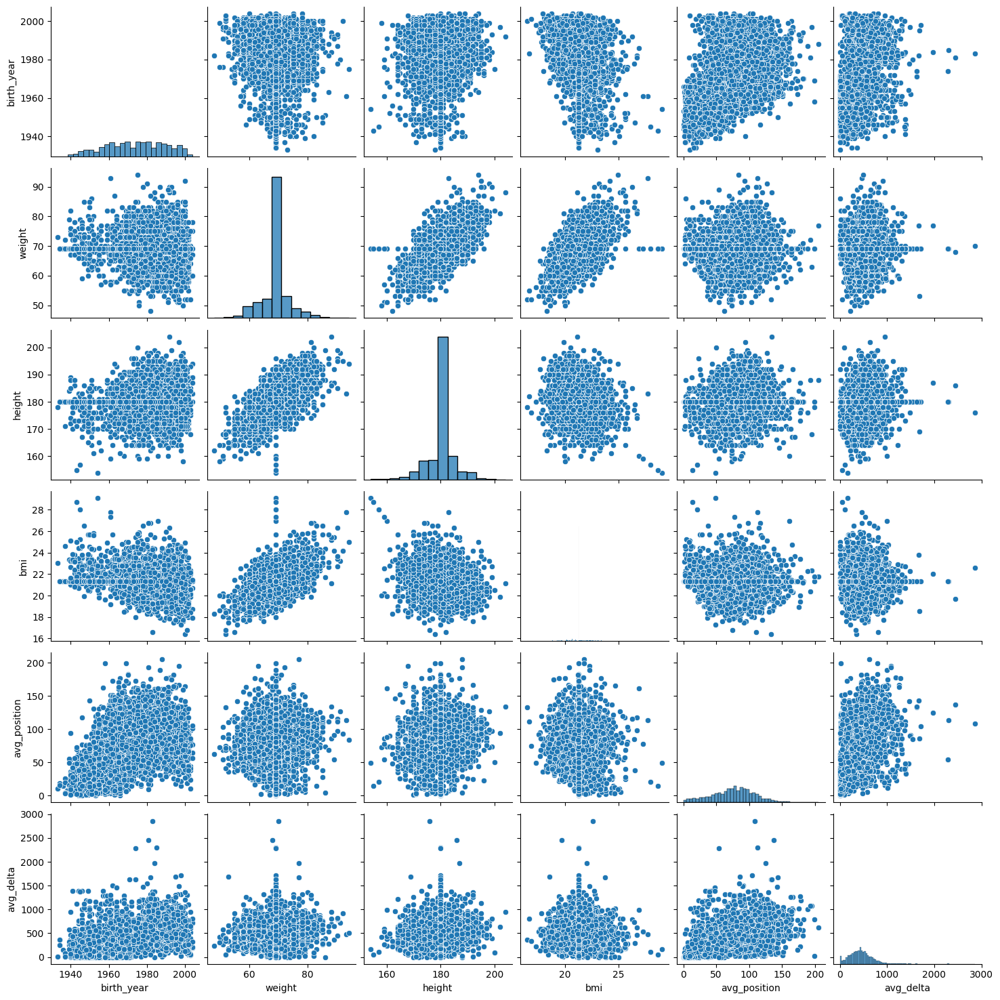

In [75]:
warnings.filterwarnings("ignore", "is_categorical_dtype")
warnings.filterwarnings("ignore", "use_inf_as_na")
sns.pairplot(cyclists)

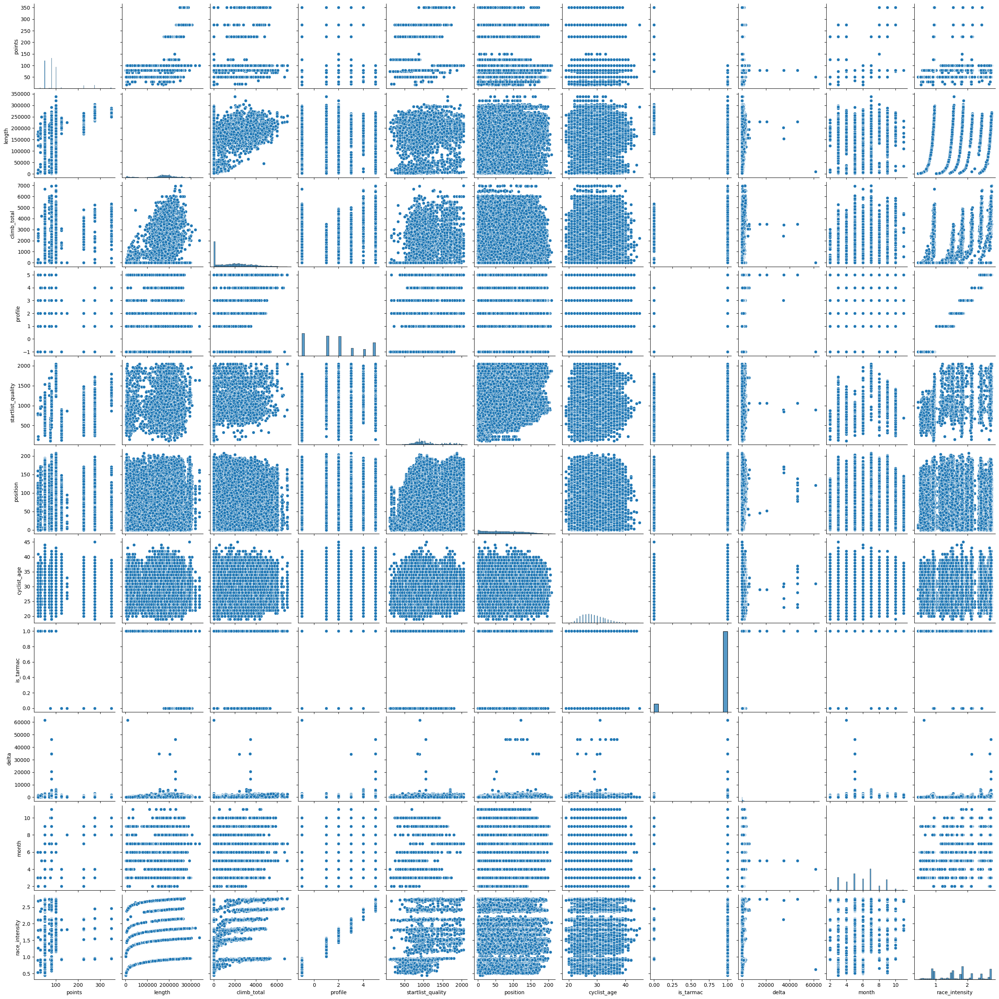

In [76]:
warnings.filterwarnings("ignore", "is_categorical_dtype")
warnings.filterwarnings("ignore", "use_inf_as_na")
races_sampled = races.sample(frac=0.1, random_state=42)
sns.pairplot(races_sampled)

We decide to apply the clustering on these pairs of features:
1. *weight* and *height*
2. *BMI* and *avg_position*
3. *avg_delta* and *avg_position*
4. *points* and *race_intensity*
5. *points* and *startlist_quality*

In the following, we create the dataframe slice of the original dataset to pass it to the clustering algorithm. Notice that for *data_pri* and *data_psq* we apply *.drop_duplicates()*, since races entries are duplicates in those attributes but differ only for attributes regarding the cyclist who attended the race.

In [77]:
data_wh = cyclists[['weight', 'height']]
data_bap = cyclists[['bmi', 'avg_position']]
data_adap = cyclists[['avg_delta', 'avg_position']]
data_pri = races.drop_duplicates(subset='_url')[['points', 'race_intensity']]
data_psq = races.drop_duplicates(subset='_url')[['points', 'startlist_quality']]

## Normalization

Normalization is a crucial step in data preparation, especially when dealing with clustering algorithms. Normalization ensures that features with different scales contribute equally to the clustering process. Since clustering methods like k-means rely on distance metrics, unnormalized data can lead to biased groupings dominated by features with larger numerical ranges.

We decided to apply the two types of normalization for each pair of features and evaluate which was the most appropriate for each single case. In the following we have a function that apply the two most common normalizations techniques:
- Standard scaler: use of the formula $z=\frac{x-\mu}{\sigma}$ with $\mu$ is the mean and $\sigma$ is the standard deviation. Keeps features distributed around a mean of 0 and standard deviation of 1. Recommended when features have Gaussian distributions.
- Min-Max scaler: trasform and scale the input data to falls in the [0,1] range.

We also use a function to show the results of the two normalizations next to each other. We show a summary of the new values, the total variability of the features and the preliminary evaluation of the distances.

In [78]:
# Initializing normalizers
scaler_standard = StandardScaler()
scaler_minmax = MinMaxScaler()

# Function to normalize data using both StandardScaler and MinMaxScaler
def normalize_data(df, columns):
    # Standardization (mean=0, std=1)
    standard_normalized = scaler_standard.fit_transform(df)
    standard_normalized_df = pd.DataFrame(standard_normalized, columns=columns)
    
    # Min-Max Scaling (values between 0 and 1)
    minmax_normalized = scaler_minmax.fit_transform(df)
    minmax_normalized_df = pd.DataFrame(minmax_normalized, columns=columns)
    
    return standard_normalized_df, minmax_normalized_df

# Function to compare Standardization and Min-Max Scaling with histograms
def plot_normalization(data_standard, data_minmax, columns, title_prefix):
    fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

    # Plot for Standardized data
    for col in columns:
        sns.histplot(data_standard[col], kde=True, ax=axes[0], label=col, alpha=0.6)
    axes[0].set_title(f"{title_prefix} - Standardized (Mean=0, Std=1)", fontsize=14)
    axes[0].set_xlabel("Values", fontsize=12)
    axes[0].set_ylabel("Frequency", fontsize=12)
    axes[0].legend()
    
    # Plot for Min-Max Scaled data
    for col in columns:
        sns.histplot(data_minmax[col], kde=True, ax=axes[1], label=col, alpha=0.6)
    axes[1].set_title(f"{title_prefix} - Min-Max Scaled (0 to 1)", fontsize=14)
    axes[1].set_xlabel("Values", fontsize=12)
    axes[1].set_ylabel("")
    axes[1].legend()
    
    plt.tight_layout()
    plt.show()

First we see the pair 'weight' and 'height'.
Overall StandardScaler offers better normalization as it has a higher total variance while also maintaining the higher average distance to avoid information loss.

Standard normalization summary:
             weight        height
count  6.134000e+03  6.134000e+03
mean   1.811687e-15  1.868447e-15
std    1.000082e+00  1.000082e+00
min   -4.629239e+00 -5.616318e+00
25%    3.805898e-02  2.053505e-02
50%    3.805898e-02  2.053505e-02
75%    3.805898e-02  2.053505e-02
max    5.594366e+00  5.223784e+00
Total variance (Standard): 2.000326104679602
Average distance (Standard): 1.4595984500902277

Min-Max normalization summary:
            weight       height
count  6134.000000  6134.000000
mean      0.452799     0.518106
std       0.097821     0.092258
min       0.000000     0.000000
25%       0.456522     0.520000
50%       0.456522     0.520000
75%       0.456522     0.520000
max       1.000000     1.000000
Total variance (Min-Max): 0.0180803756783603
Average distance (Min-Max): 0.13874624944232625


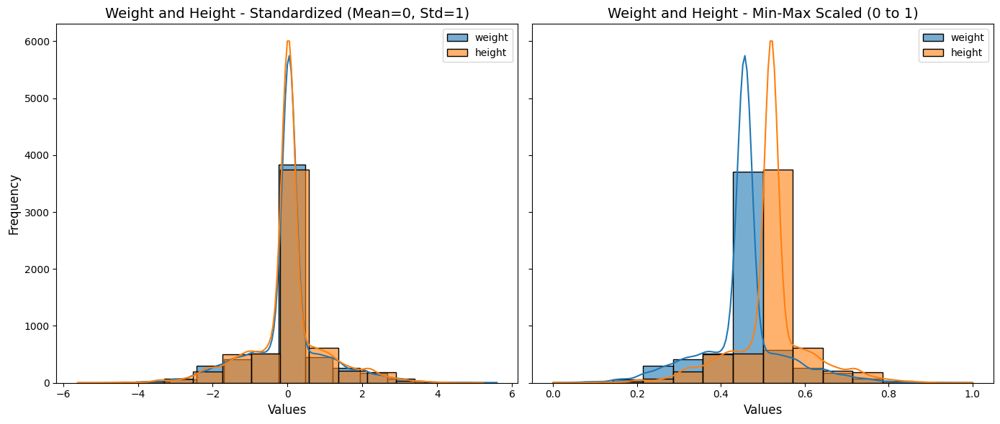

In [79]:
data_wh_standard, data_wh_minmax = normalize_data(cyclists[['weight', 'height']], ['weight', 'height'])

standard_summary = data_wh_standard.describe()
minmax_summary = data_wh_minmax.describe()

standard_variance = data_wh_standard.var(axis=0).sum()
minmax_variance = data_wh_minmax.var(axis=0).sum()

standard_distances = pdist(data_wh_standard)
minmax_distances = pdist(data_wh_minmax)


print("Standard normalization summary:")
print(standard_summary)
print(f"Total variance (Standard): {standard_variance}")
print(f"Average distance (Standard): {standard_distances.mean()}")

print("\nMin-Max normalization summary:")
print(minmax_summary)
print(f"Total variance (Min-Max): {minmax_variance}")
print(f"Average distance (Min-Max): {minmax_distances.mean()}")

plot_normalization(data_wh_standard, data_wh_minmax, ['weight', 'height'], "Weight and Height")

For the pair 'bmi' and 'avg_position' we have a similar situation with once again StandardScaler which has a higher total variance and average distance.

Standard normalization summary:
                bmi  avg_position
count  6.134000e+03  6.134000e+03
mean  -2.145876e-15  7.123961e-17
std    1.000082e+00  1.000082e+00
min   -4.834627e+00 -2.301643e+00
25%   -1.245299e-01 -6.656579e-01
50%    3.868743e-02  6.144648e-02
75%    3.868743e-02  6.673668e-01
max    7.819250e+00  3.909040e+00
Total variance (Standard): 2.000326104679602
Average distance (Standard): 1.706399972560123

Min-Max normalization summary:
               bmi  avg_position
count  6134.000000   6134.000000
mean      0.382067      0.370594
std       0.079034      0.161026
min       0.000000      0.000000
25%       0.372226      0.263415
50%       0.385124      0.380488
75%       0.385124      0.478049
max       1.000000      1.000000
Total variance (Min-Max): 0.0180803756783603
Average distance (Min-Max): 0.2160589625795502


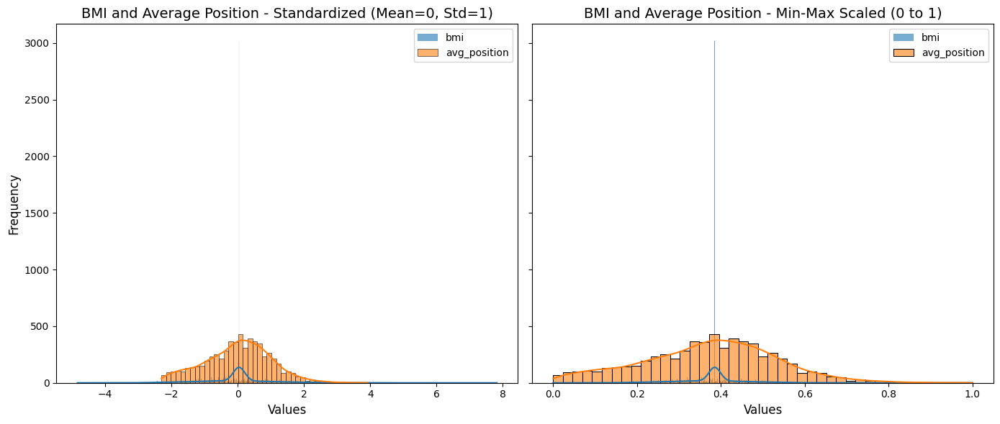

In [80]:
data_bap_standard, data_bap_minmax = normalize_data(cyclists[['bmi', 'avg_position']], ['bmi', 'avg_position'])

standard_summary = data_bap_standard.describe()
minmax_summary = data_bap_minmax.describe()

standard_variance = data_bap_standard.var(axis=0).sum()
minmax_variance = data_wh_minmax.var(axis=0).sum()

standard_distances = pdist(data_bap_standard)
minmax_distances = pdist(data_bap_minmax)

print("Standard normalization summary:")
print(standard_summary)
print(f"Total variance (Standard): {standard_variance}")
print(f"Average distance (Standard): {standard_distances.mean()}")

print("\nMin-Max normalization summary:")
print(minmax_summary)
print(f"Total variance (Min-Max): {minmax_variance}")
print(f"Average distance (Min-Max): {minmax_distances.mean()}")

plot_normalization(data_bap_standard, data_bap_minmax, ['bmi', 'avg_position'], "BMI and Average Position")

The same argument can be made for the pair 'avg_delta' and 'avg_position'.

Standard normalization summary:
          avg_delta  avg_position
count  6.134000e+03  6.134000e+03
mean   2.698997e-16  7.123961e-17
std    1.000082e+00  1.000082e+00
min   -1.814555e+00 -2.301643e+00
25%   -6.658658e-01 -6.656579e-01
50%   -6.460478e-02  6.144648e-02
75%    5.448062e-01  6.673668e-01
max    9.904063e+00  3.909040e+00
Total variance (Standard): 2.000326104679602
Average distance (Standard): 1.684932755843625

Min-Max normalization summary:
         avg_delta  avg_position
count  6134.000000   6134.000000
mean      0.154844      0.370594
std       0.085341      0.161026
min       0.000000      0.000000
25%       0.098023      0.263415
50%       0.149331      0.380488
75%       0.201334      0.478049
max       1.000000      1.000000
Total variance (Min-Max): 0.033212506784389556
Average distance (Min-Max): 0.21585461168584688


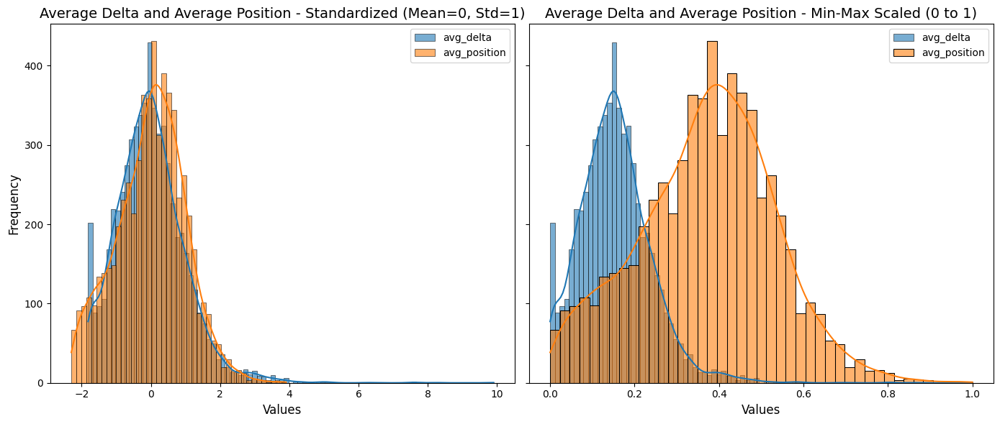

In [81]:
data_adap_standard, data_adap_minmax = normalize_data(cyclists[['avg_delta', 'avg_position']], ['avg_delta', 'avg_position'])

standard_summary = data_adap_standard.describe()
minmax_summary = data_adap_minmax.describe()

standard_variance = data_adap_standard.var(axis=0).sum()
minmax_variance = data_adap_minmax.var(axis=0).sum()

standard_distances = pdist(data_adap_standard)
minmax_distances = pdist(data_adap_minmax)

print("Standard normalization summary:")
print(standard_summary)
print(f"Total variance (Standard): {standard_variance}")
print(f"Average distance (Standard): {standard_distances.mean()}")

print("\nMin-Max normalization summary:")
print(minmax_summary)
print(f"Total variance (Min-Max): {minmax_variance}")
print(f"Average distance (Min-Max): {minmax_distances.mean()}")

plot_normalization(data_adap_standard, data_adap_minmax, ['avg_delta', 'avg_position'], "Average Delta and Average Position")

Even in this case the StandardScaler values ​​are better but a higher average distance can be noticed for Min-Max.

Standard normalization summary:
             points  race_intensity
count  5.281000e+03    5.281000e+03
mean   2.825487e-17    5.112786e-17
std    1.000095e+00    1.000095e+00
min   -1.164080e+00   -1.577649e+00
25%   -6.427917e-01   -8.598366e-01
50%   -1.540836e-01   -5.804468e-03
75%    1.717219e-01    5.551806e-01
max    4.244290e+00    1.964638e+00
Total variance (Standard): 2.0003787878787875
Average distance (Standard): 1.640111996905608

Min-Max normalization summary:
            points  race_intensity
count  5281.000000     5281.000000
mean      0.215237        0.445376
std       0.184916        0.282330
min       0.000000        0.000000
25%       0.096386        0.202641
50%       0.186747        0.443737
75%       0.246988        0.602105
max       1.000000        1.000000
Total variance (Min-Max): 0.11390434467610859
Average distance (Min-Max): 0.3992565200022438


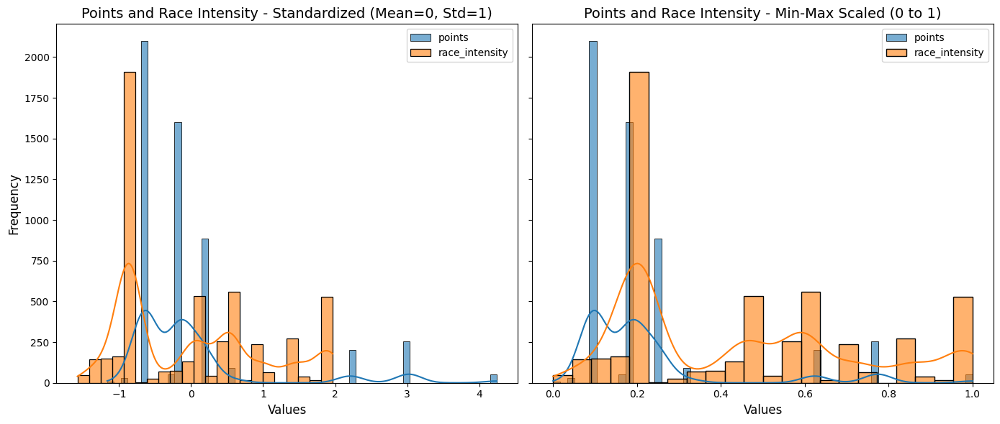

In [82]:
data_pri_standard, data_pri_minmax = normalize_data(
    races.drop_duplicates(subset='_url')[['points', 'race_intensity']], ['points', 'race_intensity']
)

standard_summary = data_pri_standard.describe()
minmax_summary = data_pri_minmax.describe()

standard_variance = data_pri_standard.var(axis=0).sum()
minmax_variance = data_pri_minmax.var(axis=0).sum()

standard_distances = pdist(data_pri_standard)
minmax_distances = pdist(data_pri_minmax)

print("Standard normalization summary:")
print(standard_summary)
print(f"Total variance (Standard): {standard_variance}")
print(f"Average distance (Standard): {standard_distances.mean()}")

print("\nMin-Max normalization summary:")
print(minmax_summary)
print(f"Total variance (Min-Max): {minmax_variance}")
print(f"Average distance (Min-Max): {minmax_distances.mean()}")

plot_normalization(data_pri_standard, data_pri_minmax, ['points', 'race_intensity'], "Points and Race Intensity")

You can see how even for the pair 'points' 'startlist_quality' there is a better data distribution for StandardScaler. Despite this common trend it was decided to show when appropriate also the version of the features normalized with Min-Max.

Standard normalization summary:
             points  startlist_quality
count  5.281000e+03       5.281000e+03
mean   2.825487e-17      -5.583701e-17
std    1.000095e+00       1.000095e+00
min   -1.164080e+00      -2.296707e+00
25%   -6.427917e-01      -6.353630e-01
50%   -1.540836e-01      -1.884825e-01
75%    1.717219e-01       4.634372e-01
max    4.244290e+00       2.781958e+00
Total variance (Standard): 2.000378787878788
Average distance (Standard): 1.6080104521106395

Min-Max normalization summary:
            points  startlist_quality
count  5281.000000        5281.000000
mean      0.215237           0.452226
std       0.184916           0.196921
min       0.000000           0.000000
25%       0.096386           0.327122
50%       0.186747           0.415114
75%       0.246988           0.543478
max       1.000000           1.000000
Total variance (Min-Max): 0.072971762125659
Average distance (Min-Max): 0.3086706759657576


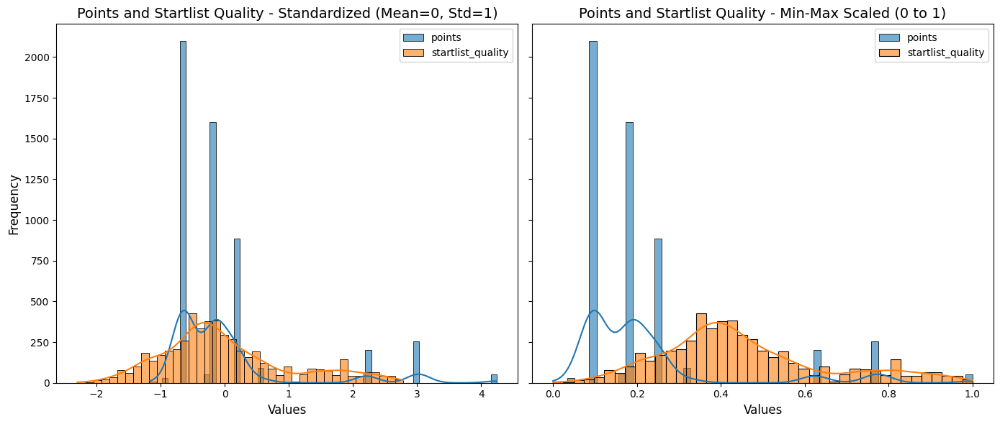

In [83]:
data_psq_standard, data_psq_minmax = normalize_data(
    races.drop_duplicates(subset='_url')[['points', 'startlist_quality']], ['points', 'startlist_quality']
)

standard_summary = data_psq_standard.describe()
minmax_summary = data_psq_minmax.describe()

standard_variance = data_psq_standard.var(axis=0).sum()
minmax_variance = data_psq_minmax.var(axis=0).sum()

standard_distances = pdist(data_psq_standard)
minmax_distances = pdist(data_psq_minmax)

print("Standard normalization summary:")
print(standard_summary)
print(f"Total variance (Standard): {standard_variance}")
print(f"Average distance (Standard): {standard_distances.mean()}")

print("\nMin-Max normalization summary:")
print(minmax_summary)
print(f"Total variance (Min-Max): {minmax_variance}")
print(f"Average distance (Min-Max): {minmax_distances.mean()}")

plot_normalization(data_psq_standard, data_psq_minmax, ['points', 'startlist_quality'], "Points and Startlist Quality")

## K-means Clustering

Let's start this task with K-means clustering.
K-Means clustering is an algorithm that groups data points into *k distinct clusters* based on their similarity. It minimizes the sum of squared distances between each point and the centroid of its assigned cluster. The algorithm iteratively updates centroids and reassigns points until convergence. 
For better approximate the number of clusters, we apply the Elbow method.

In [84]:
def plot_elbow(data1, data2):
    """
    Plots two side-by-side Elbow Method graphs.
    
    :param data1: First standardized dataset
    :param data2: Second standardized dataset
    """

    titles = ['Standardized Data', 'Min-Max Scaled Data']

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))  # 1 row, 2 columns
    
    for i, (data, title, ax) in enumerate(zip([data1, data2], titles, axes)):
        inertia = []
        k_values = range(1, 11)
        
        # Calculate inertia for each value of k
        for k in k_values:
            kmeans = KMeans(n_clusters=k, random_state=0)
            kmeans.fit(data)
            inertia.append(kmeans.inertia_)
        
        # Plot the graph
        ax.plot(k_values, inertia, 'bo-')
        ax.set_xlabel('Number of Clusters k')
        ax.set_ylabel('Inertia')
        ax.set_title(title)

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()

In [85]:
def analyze_and_plot_clusters(data1, data2, n_clusters, xlabel, ylabel):
    """
    Analyzes and plots side-by-side scatter plots for K-means clustering results.
    Additionally, computes and prints cluster statistics: centroids, size, silhouette score, and cohesion.
    
    :param data1: First dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param data2: Second dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param n_clusters: Numbers of clusters for K-means (Array of 2 integers)
    :param xlabel: label for x axis
    :param ylabel: label for y axis
    """

    titles = ['Standardized Data', 'Min-Max Scaled Data']

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))  # 1 row, 2 columns
    
    for i, (data, n_cluster, title, ax) in enumerate(zip([data1, data2], n_clusters, titles, axes)):
        # Fit K-means clustering
        kmeans = KMeans(n_clusters=n_cluster, random_state=42)
        kmeans.fit(data)
        
        # Print cluster statistics
        print(f"\n--- {title} ---")
        print(f"Cluster centroids [{xlabel} {ylabel}]:")
        print(kmeans.cluster_centers_)
        print("Number of cyclists in each cluster:")
        print(pd.Series(kmeans.labels_).value_counts().sort_index())
        
        # Compute silhouette score
        silhouette = silhouette_score(data, kmeans.labels_, metric='euclidean')
        print(f"Silhouette score: {silhouette}")
        
        # Compute cohesion (sum of squared distances to centroids)
        cohesion = kmeans.inertia_
        print(f"Cohesion: {cohesion}")
        
        # Plot each cluster with a different color
        for cluster_id in range(n_cluster):
            cluster_data = data[kmeans.labels_ == cluster_id]
            ax.scatter(cluster_data[:, 0], cluster_data[:, 1], label=f'Cluster {cluster_id}')
        
        # Plot the centroids
        centroids = kmeans.cluster_centers_
        ax.scatter(centroids[:, 0], centroids[:, 1], s=300, c='red', marker='X', label='Centroids')
        
        # Customize the plot
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.set_title(title)
        ax.legend()
        ax.grid(True)
    
    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()

### 1. Applying K-Means to *weight* and *height*.

From the application of the Elbow method we decide to use $k=3$ for both the normalizations.

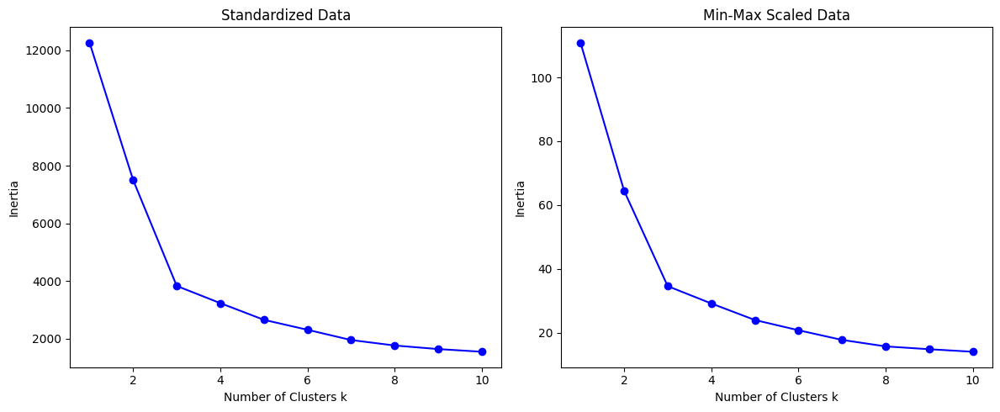

In [86]:
# Plot the elbow method for Standardized and Min-Max Scaled data
plot_elbow(data_wh_standard, data_wh_minmax)

The created clusters look very similar and we have given the 3 clusters, the 3 centroids group the cyclists in a way such that one group contains the shorter and thinner cyclists, the medium high and normal weighted cyclists and the higher and heavier cyclists. By constraction, no outlier is left because they are included in the nearest cluster.

As regards the silhouette score values ​​they are practically identical while the cohesion is decidedly lower for the cluster created with Min-Max which therefore in this case is more compact and therefore preferable.


--- Standardized Data ---
Cluster centroids [Weight Height]:
[[ 1.65118518  1.67255487]
 [ 0.03123175  0.02488255]
 [-1.60059613 -1.58542476]]
Number of cyclists in each cluster:
0     742
1    4538
2     854
dtype: int64
Silhouette score: 0.6464171476189584
Cohesion: 3827.6058672795807

--- Min-Max Scaled Data ---
Cluster centroids [Weight Height]:
[[0.61685862 0.66704636]
 [0.45548508 0.52060217]
 [0.29502925 0.37457077]]
Number of cyclists in each cluster:
0     755
1    4517
2     862
dtype: int64
Silhouette score: 0.6464320492470409
Cohesion: 34.54109088060794


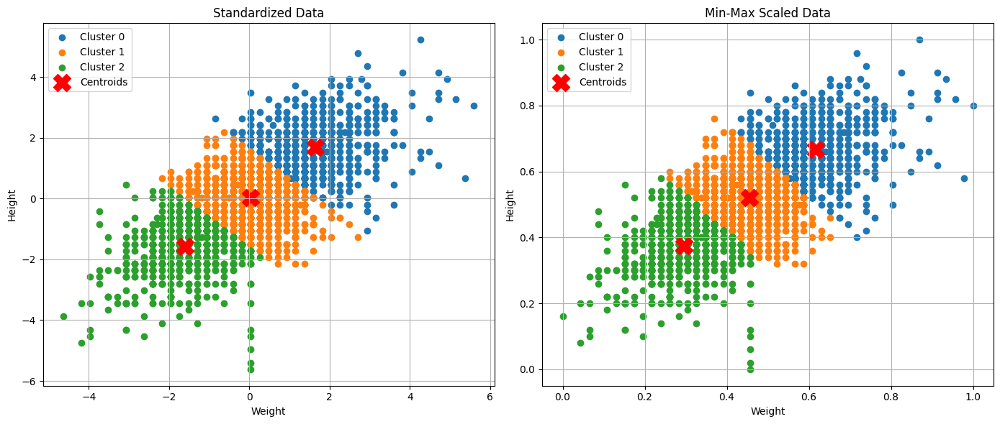

In [87]:
# Analyze and plot clusters for Standardized and Min-Max Scaled data
analyze_and_plot_clusters(data_wh_standard.values, data_wh_minmax.values, [3,3], xlabel='Weight', ylabel='Height')

### 2. Applying K-Means to *bmi* and *avg_position*.

From this pair of feature the Elbow method results different between the two normalizations: for StandardScaler we chose $k=4$ while for Min-Max $k=3$.

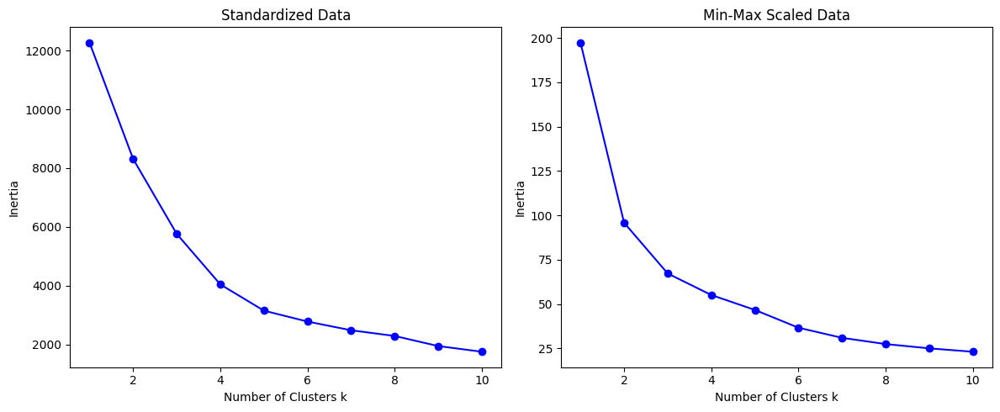

In [88]:
# Plot the elbow method for Standardized and Min-Max Scaled data
plot_elbow(data_bap_standard, data_bap_minmax)

The cyclists are more or less equally distributed, but we can point out the presence of a certain number of noisy values.
The silhouette score is higher in the StandardScore while the cohesion is lower in the Min-Max.


--- Standardized Data ---
Cluster centroids [BMI Average Position]:
[[ 0.04401533  0.71288593]
 [ 0.04751696 -1.02918073]
 [-1.62218072  0.15687893]
 [ 2.01620082  0.21147896]]
Number of cyclists in each cluster:
0    2624
1    2066
2     858
3     586
dtype: int64
Silhouette score: 0.43645889916541125
Cohesion: 4044.267641252411

--- Min-Max Scaled Data ---
Cluster centroids [BMI Average Position]:
[[0.39099983 0.55452082]
 [0.39051274 0.15930664]
 [0.37170018 0.37065157]]
Number of cyclists in each cluster:
0    1780
1    1553
2    2801
dtype: int64
Silhouette score: 0.3826183548536815
Cohesion: 67.21019609281609


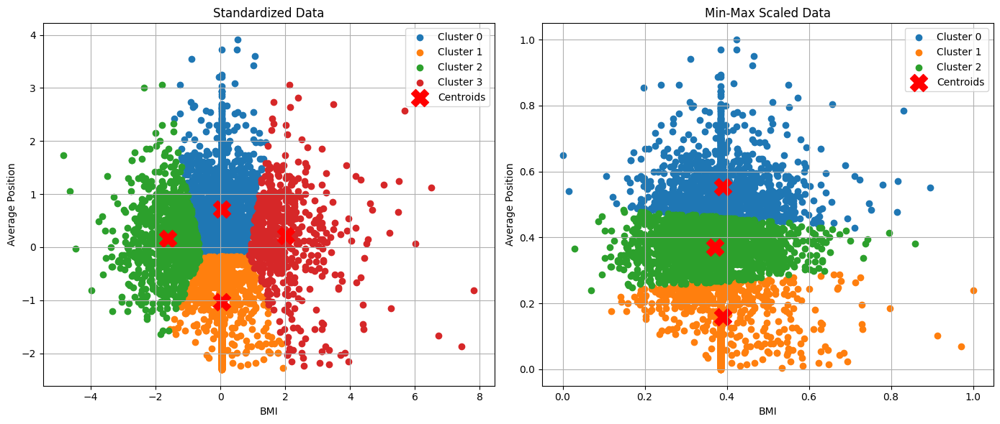

In [89]:
# Analyze and plot clusters for Standardized and Min-Max Scaled data
analyze_and_plot_clusters(data_bap_standard.values, data_bap_minmax.values, [4,3], xlabel='BMI', ylabel='Average Position')

### 3. Applying K-Means to *avg_delta* and *avg_position*.

From the application of the Elbow method we decide to use $k=3$ for both the normalization.

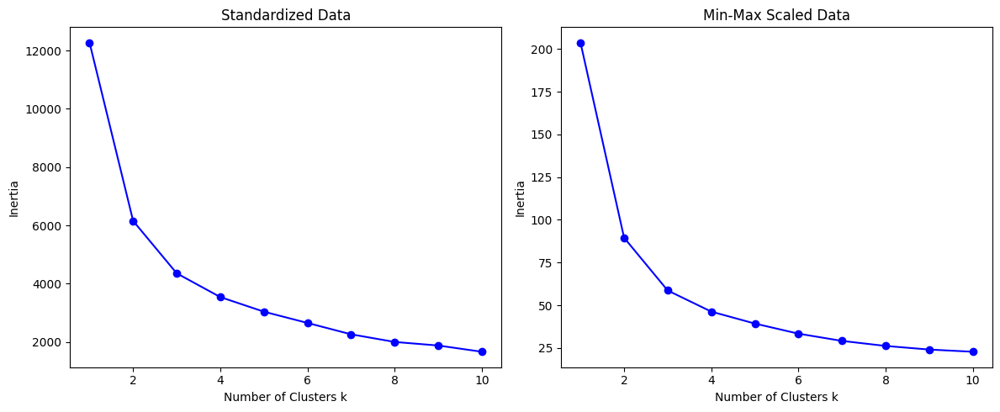

In [90]:
# Plot the elbow method for Standardized and Min-Max Scaled data
plot_elbow(data_adap_standard, data_adap_minmax)

The two cluster divisions in this case are visibly different with StandardScaler concentrating most of the points in Cluster 0 while Min-Max concentrates them in Cluster 1. The silhouette score this time is higher for Min-Max which also has a lower cohesion thus resulting in the most suitable normalization.


--- Standardized Data ---
Cluster centroids [Average Delta Average Position]:
[[-0.03270195  0.24177444]
 [-0.92496064 -1.15123612]
 [ 1.28856941  1.01325535]]
Number of cyclists in each cluster:
0    2908
1    1832
2    1394
dtype: int64
Silhouette score: 0.3875829389182629
Cohesion: 4355.161265609024

--- Min-Max Scaled Data ---
Cluster centroids [Average Delta Average Position]:
[[0.22195482 0.54771965]
 [0.15095979 0.36628627]
 [0.07825332 0.157673  ]]
Number of cyclists in each cluster:
0    1875
1    2738
2    1521
dtype: int64
Silhouette score: 0.414710753687812
Cohesion: 58.674954486528065


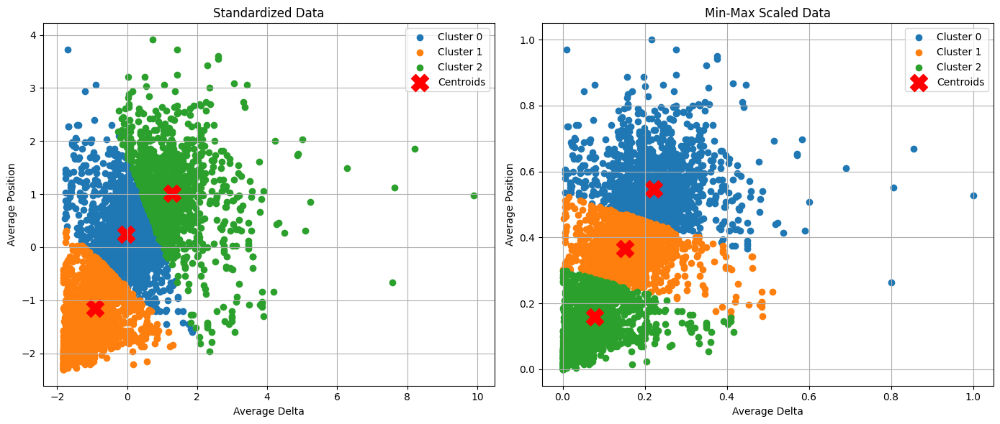

In [91]:
# Analyze and plot clusters for Standardized and Min-Max Scaled data
analyze_and_plot_clusters(data_adap_standard.values, data_adap_minmax.values, [3,3], xlabel='Average Delta', ylabel='Average Position')

### 4. Applying K-Means to *points* and *race_intensity*.

For the Elbow method, we consider $k=3$.

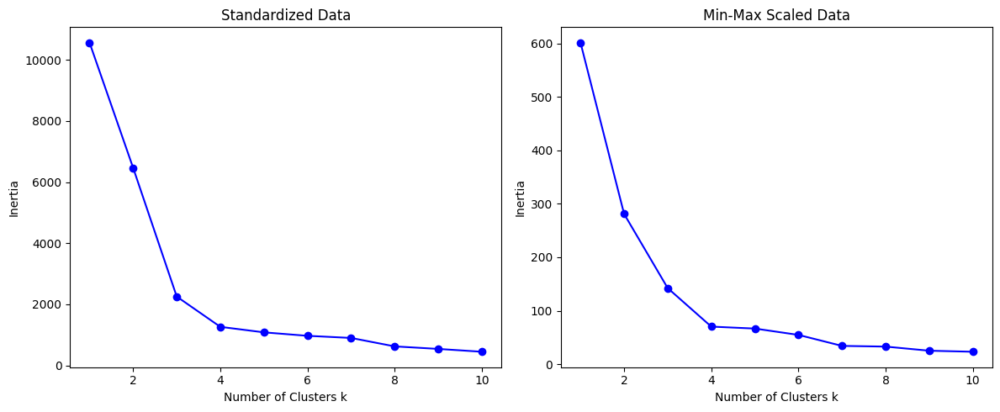

In [92]:
# Plot the elbow method for Standardized and Min-Max Scaled data
plot_elbow(data_pri_standard, data_pri_minmax)

For 'points' and 'race_intensity' the split is very similar, as is the silhouette score. As for the other features the cohesion is lower for Min-Max


--- Standardized Data ---
Cluster centroids [Points Race Intensity]:
[[-0.36541353 -0.68509222]
 [-0.2012747   1.14761246]
 [ 2.8284735  -0.17798564]]
Number of cyclists in each cluster:
0    2938
1    1833
2     510
dtype: int64
Silhouette score: 0.5856305051191946
Cohesion: 2206.108325798957

--- Min-Max Scaled Data ---
Cluster centroids [Points Race Intensity]:
[[0.13471907 0.19926462]
 [0.183284   0.69546894]
 [0.73821758 0.39512985]]
Number of cyclists in each cluster:
0    2356
1    2415
2     510
dtype: int64
Silhouette score: 0.6069286796549512
Cohesion: 149.15291342320842


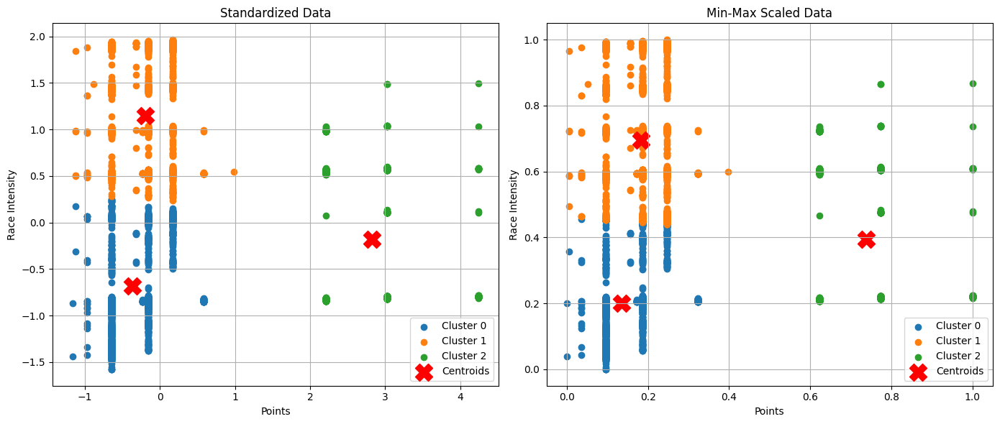

In [93]:
# Analyze and plot clusters for Standardized and Min-Max Scaled data
analyze_and_plot_clusters(data_pri_standard.values, data_pri_minmax.values, [3,3], xlabel='Points', ylabel='Race Intensity')

### 5. Applying K-Means to *points* and *startlist_quality*.

For the Elbow method, we take $k=3$.

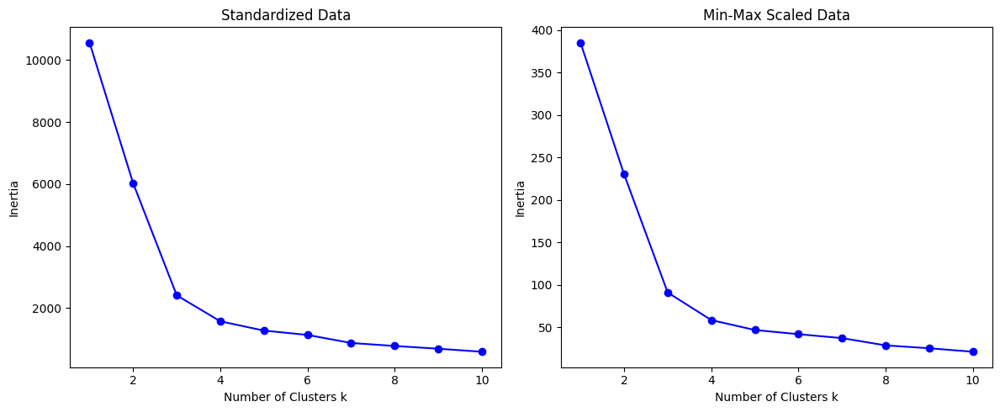

In [94]:
# Plot the elbow method for Standardized and Min-Max Scaled data
plot_elbow(data_psq_standard, data_psq_minmax)

The same argument made above also applies to 'points' and 'startlist_quality'.


--- Standardized Data ---
Cluster centroids [Points Startlist Quality]:
[[-0.41793542 -0.42368372]
 [ 2.8284735  -0.17881816]
 [ 0.11589653  1.62142013]]
Number of cyclists in each cluster:
0    3738
1     510
2    1033
dtype: int64
Silhouette score: 0.6224848964952321
Cohesion: 2412.0058614172062

--- Min-Max Scaled Data ---
Cluster centroids [Points Startlist Quality]:
[[0.13796115 0.36880225]
 [0.73821758 0.41701681]
 [0.23666593 0.7714876 ]]
Number of cyclists in each cluster:
0    3738
1     510
2    1033
dtype: int64
Silhouette score: 0.6230396415971892
Cohesion: 91.06692249572113


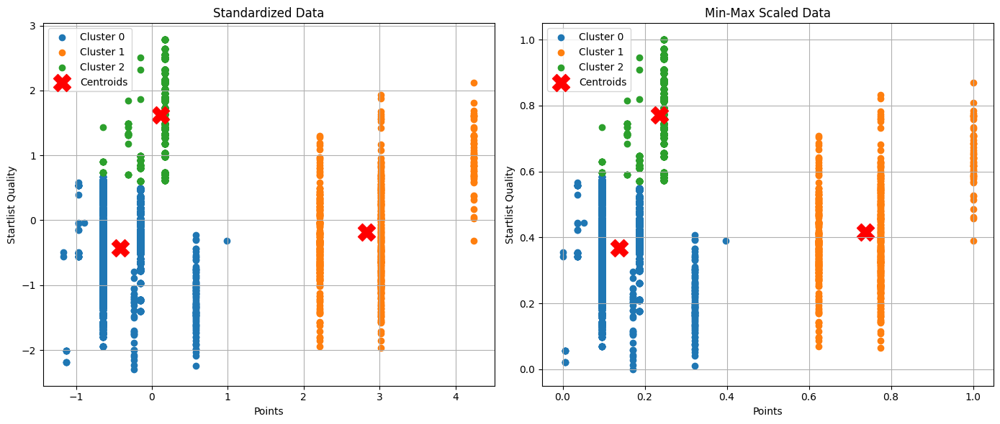

In [95]:
# Analyze and plot clusters for Standardized and Min-Max Scaled data
analyze_and_plot_clusters(data_psq_standard.values, data_psq_minmax.values, [3,3], xlabel='Points', ylabel='Startlist Quality')

## Density-Based Clustering

DBSCAN creates clusters based on dense points employing two parameters: ***eps*** (= *max admissible distance between two near points belonging to the same cluster*) and ***min_samples*** (= *minimum number of required points for a cluster to be defined*). 
As we have done with K-mean clustering, we first proceed computing the appropriate value for these two parameters and then show the output of clustering. 
Let's begin with the easier variable to define, *min_points*. The choice of *min_samples* is pretty arbitrary: the more our data is omogenous, the more we can increase this value. Tipically, it is defined to be the size of our feature plus 1 (for us, always 3).
For what concerns *eps* we use the elbow method using K-NN distance graph presented below. We try to estimate the most suitable epsilon value, in case the estimate is not satisfactory we proceed to manually modify this value.

In [96]:
def analyze_and_plot_knn(data1, data2, min_samples):
    """
    Analyzes and plots side-by-side K-NN distance graphs for two datasets,
    highlighting the elbow point and returning estimated epsilon values.
    
    :param data1: First dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param data2: Second dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param min_samples: Number of neighbors to consider for K-NN distance
    :return: Estimated epsilon values for data1 and data2
    """
    titles = ['Standardized Data', 'Min-Max Scaled Data']
    epsilons = []  # Store estimated epsilon values

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))  # 1 row, 2 columns
    
    for i, (data, title, ax) in enumerate(zip([data1, data2], titles, axes)):
        # Compute the pairwise Euclidean distances
        dist = pdist(data, 'euclidean')
        dist = squareform(dist)  # Convert to square matrix
        
        # Compute the k-th nearest distances
        kth_distances = []
        for d in dist:
            index_kth_distance = np.argsort(d)[min_samples]
            kth_distances.append(d[index_kth_distance])
        
        # Sort the k-th distances for plotting
        sorted_kth_distances = sorted(kth_distances)
        
        # Estimate the elbow point
        elbow_index = np.argmax(np.gradient(sorted_kth_distances))
        estimated_epsilon = sorted_kth_distances[elbow_index]
        epsilons.append(estimated_epsilon)
        
        # Plot the distances
        ax.plot(range(len(sorted_kth_distances)), sorted_kth_distances, label='Sorted Distances')
        ax.axvline(x=elbow_index, color='red', linestyle='--', label='Elbow Point')
        ax.set_ylabel(f'Distance from {min_samples}th Neighbor')
        ax.set_xlabel('Sorted Distances')
        ax.set_title(title)
        ax.legend()
        
        # Print key statistics for analysis
        print(f"\n--- {title} ---")
        print(f"Minimum {min_samples}th distance: {np.min(kth_distances)}")
        print(f"Median {min_samples}th distance: {np.median(kth_distances)}")
        print(f"Maximum {min_samples}th distance: {np.max(kth_distances)}")
        print(f"Estimated epsilon (elbow point): {estimated_epsilon}")
    
    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()
    
    return epsilons

In [97]:
def analyze_and_plot_dbscan(data1, data2, eps, min_samples, xlabel, ylabel):
    """
    Analyzes, computes metrics, and plots side-by-side DBSCAN clustering results for two datasets.
    
    :param data1: First dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param data2: Second dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param eps: The maximum distance between two samples for one to be considered as in the neighborhood of the other
    :param min_samples: The number of samples in a neighborhood for a point to be considered as a core point
    :param xlabel: label for x axis
    :param ylabel: label for y axis
    """

    titles=['Standardized Data', 'Min-Max Scaled Data']

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))  # 1 row, 2 columns
    
    for i, (data, epsilon, title, ax) in enumerate(zip([data1, data2], eps, titles, axes)):
        # Apply DBSCAN clustering
        dbscan = DBSCAN(eps=epsilon, min_samples=min_samples)
        dbscan.fit(data)
        
        # Extract labels and analyze clusters
        labels = dbscan.labels_
        unique_labels, counts = np.unique(labels, return_counts=True)
        label_mapping = {
            label: f"Cluster {label + 1}" if label != -1 else "Noise"
            for label in unique_labels
        }
        
        # Metrics Calculation
        num_clusters = len(unique_labels) - (1 if -1 in unique_labels else 0)
        if num_clusters > 1:
            silhouette = silhouette_score(data, labels, metric='euclidean')
        else:
            silhouette = None  # Not defined for 1 cluster or all noise
        
        cohesion = dbscan.core_sample_indices_.shape[0] if dbscan.core_sample_indices_ is not None else 0
        
        # Print cluster analysis and metrics
        print(f"\n--- {title} ---")
        print("Cluster Analysis:")
        for label, count in zip(unique_labels, counts):
            cluster_type = "Noise" if label == -1 else f"Cluster {label + 1}"
            print(f"{cluster_type}: {count} points")
        
        print(f"Silhouette Score: {silhouette if silhouette is not None else 'Not defined'}")
        print(f"Cohesion (Core Points): {cohesion}")
        
        # Plot results with seaborn
        cluster_labels = [label_mapping[label] for label in labels]
        sns.scatterplot(
            x=data[:, 0],
            y=data[:, 1],
            hue=cluster_labels,
            palette="tab10",
            legend="full",
            ax=ax
        )
        
        # Customize the plot
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.set_title(title)
        ax.legend(title="Clusters", loc="upper right", bbox_to_anchor=(1.25, 1))
    
    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()

### 1. Applying DBSCAN to *weight* and *height*.


--- Standardized Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.0
Maximum 3th distance: 1.461737690753013
Estimated epsilon (elbow point): 1.2876062962880628

--- Min-Max Scaled Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.0
Maximum 3th distance: 0.1365771142195662
Estimated epsilon (elbow point): 0.12415613074476951


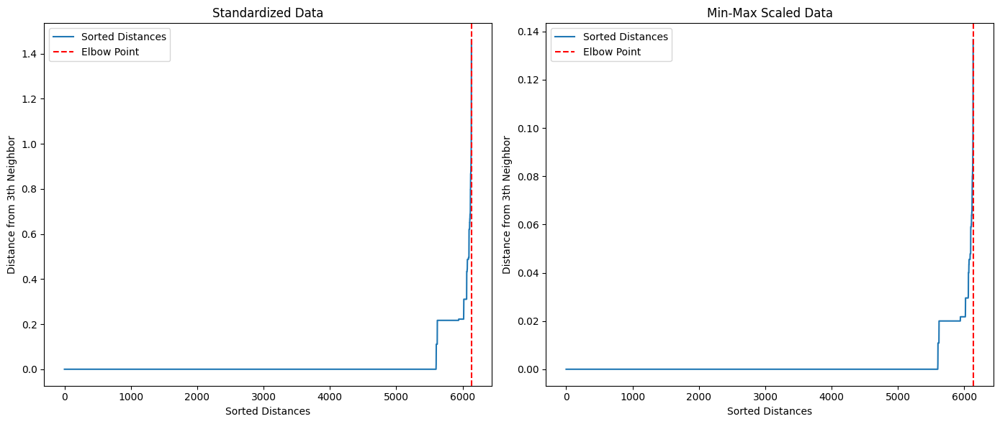

In [98]:
# Analyze and plot K-NN distances for Standardized and Min-Max Scaled data to choose the best value for eps
eps_wh = analyze_and_plot_knn(data_wh_standard.values, data_wh_minmax.values, 3)

Given the unsatisfactory estimate we choose as eps values ​​0.6 for the StandardScore and 0.05 for Min-Max.
Both plots show a larger clustering where most of the cyclists are located (that means their values ​​are not that far from the chosen epsilon values), while there are some smaller clusterings concentrated on the edge of the larger cluster. Some noisy values ​​are also identified on its edge.
Both silhouette and cohesion values ​​are equal

Epsilon for Standardized Data: 0.6
Epsilon for Min-Max Scaled Data: 0.05

--- Standardized Data ---
Cluster Analysis:
Noise: 7 points
Cluster 1: 6110 points
Cluster 2: 6 points
Cluster 3: 3 points
Cluster 4: 3 points
Cluster 5: 5 points
Silhouette Score: 0.6421529479611799
Cohesion (Core Points): 6115

--- Min-Max Scaled Data ---
Cluster Analysis:
Noise: 7 points
Cluster 1: 6110 points
Cluster 2: 6 points
Cluster 3: 3 points
Cluster 4: 3 points
Cluster 5: 5 points
Silhouette Score: 0.6376346789930764
Cohesion (Core Points): 6115


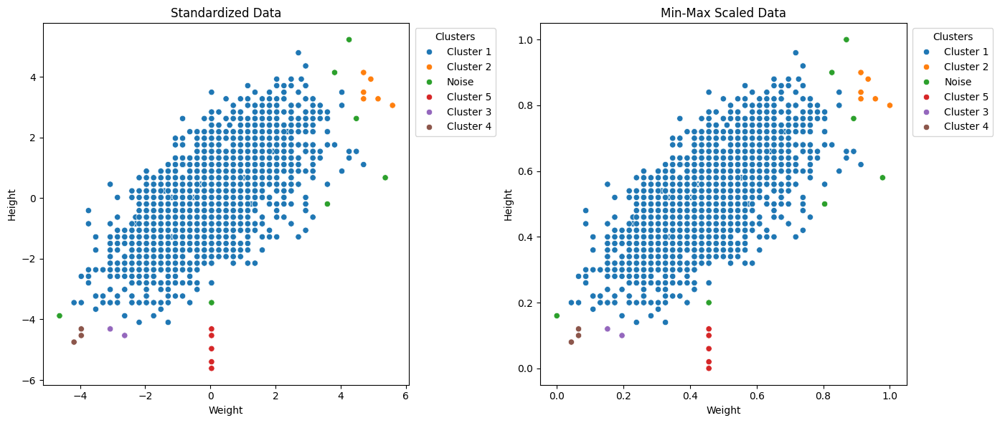

In [99]:
eps_wh = [0.6, 0.05]

# Print the used epsilon values
print(f"Epsilon for Standardized Data: {eps_wh[0]}")
print(f"Epsilon for Min-Max Scaled Data: {eps_wh[1]}")

# Apply DBSCAN clustering to the data
analyze_and_plot_dbscan(data_wh_standard.values, data_wh_minmax.values, eps_wh, min_samples=3, xlabel='Weight', ylabel='Height')

### 2. Applying DBSCAN to *bmi* and *avg_position*.


--- Standardized Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.029689170155483193
Maximum 3th distance: 2.304394438055409
Estimated epsilon (elbow point): 2.000310471404841

--- Min-Max Scaled Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.0023462508636158397
Maximum 3th distance: 0.21882033872012416
Estimated epsilon (elbow point): 0.1618514255089426


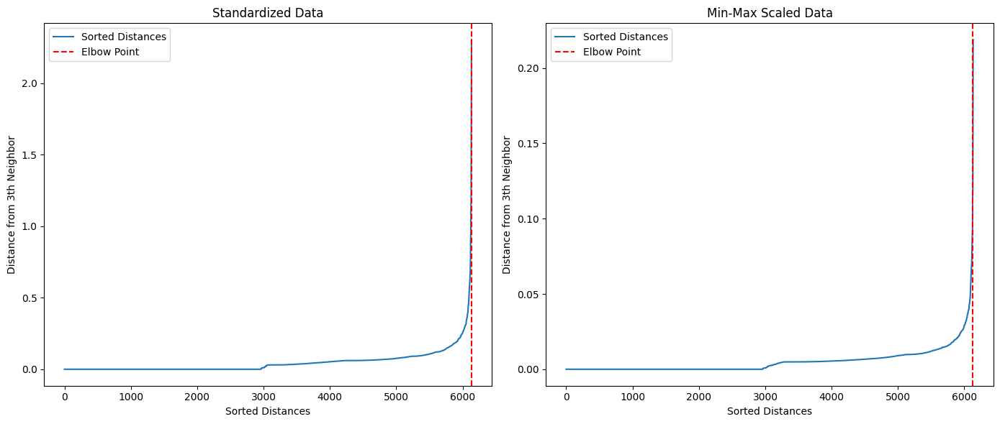

In [100]:
# analyze and plot K-NN distances for Standardized and Min-Max Scaled data
eps_bap = analyze_and_plot_knn(data_bap_standard.values, data_bap_minmax.values, 3)

In this case too the epsilon values ​​are set manually.
We have a cluster containing most of the data with a few clusters surrounding it and some points identified as noise. According to the silhouette values ​​the best division is made with the data normalized through StandardScore.

Epsilon for Standardized Data: 0.4
Epsilon for Min-Max Scaled Data: 0.04

--- Standardized Data ---
Cluster Analysis:
Noise: 30 points
Cluster 1: 6093 points
Cluster 2: 5 points
Cluster 3: 3 points
Cluster 4: 3 points
Silhouette Score: 0.5794213513589949
Cohesion (Core Points): 6094

--- Min-Max Scaled Data ---
Cluster Analysis:
Noise: 37 points
Cluster 1: 6086 points
Cluster 2: 8 points
Cluster 3: 3 points
Silhouette Score: 0.41636993960669283
Cohesion (Core Points): 6087


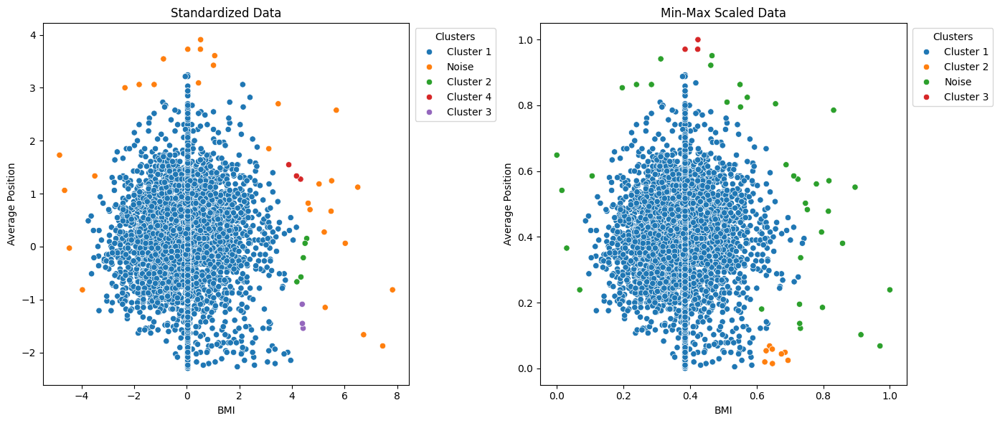

In [101]:
eps_bap = [0.4, 0.04]

# Print the used epsilon values
print(f"Epsilon for Standardized Data: {eps_bap[0]}")
print(f"Epsilon for Min-Max Scaled Data: {eps_bap[1]}")

# Apply DBSCAN clustering to the data
analyze_and_plot_dbscan(data_bap_standard.values, data_bap_minmax.values, eps_bap, min_samples=3, xlabel='BMI', ylabel='Average Position')

### 3. Applying DBSCAN to *avg_delta* and *avg_position*.


--- Standardized Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.0322081839099774
Maximum 3th distance: 2.8506483807997074
Estimated epsilon (elbow point): 2.596280243218117

--- Min-Max Scaled Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.004673949354369489
Maximum 3th distance: 0.3203040736900854
Estimated epsilon (elbow point): 0.29114453165100457


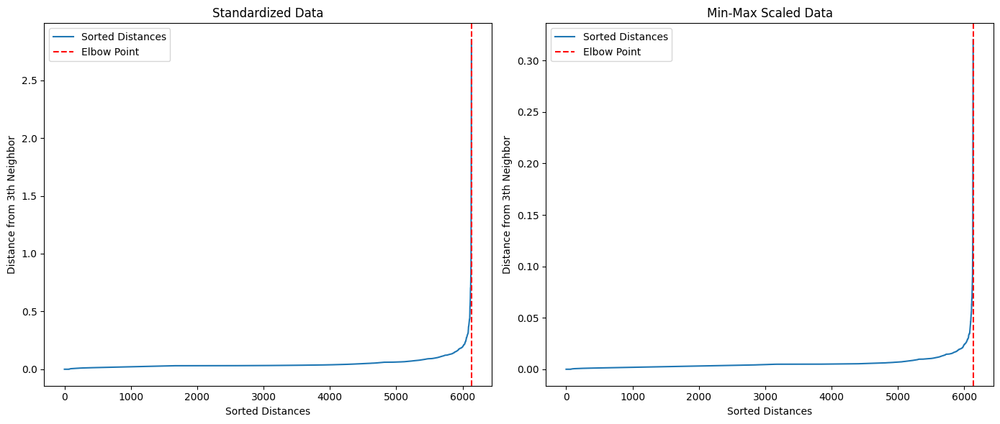

In [102]:
# analyze and plot K-NN distances for Standardized and Min-Max Scaled data for choosing the best value for eps
eps_adap = analyze_and_plot_knn(data_adap_standard.values, data_adap_minmax.values, 3)

In this case too the epsilon values ​​are set manually.
The behavior is similar to the previous ones with a large central cluster and many small ones surrounding it. In this case we have even lower silhouette values ​​which, as visible even to the eye, identify the StandardScore as the best.

Epsilon for Standardized Data: 0.3
Epsilon for Min-Max Scaled Data: 0.03

--- Standardized Data ---
Cluster Analysis:
Noise: 31 points
Cluster 1: 6079 points
Cluster 2: 12 points
Cluster 3: 3 points
Cluster 4: 3 points
Cluster 5: 6 points
Silhouette Score: 0.39193185412268633
Cohesion (Core Points): 6091

--- Min-Max Scaled Data ---
Cluster Analysis:
Noise: 47 points
Cluster 1: 6063 points
Cluster 2: 9 points
Cluster 3: 4 points
Cluster 4: 3 points
Cluster 5: 8 points
Silhouette Score: 0.17733447372341107
Cohesion (Core Points): 6078


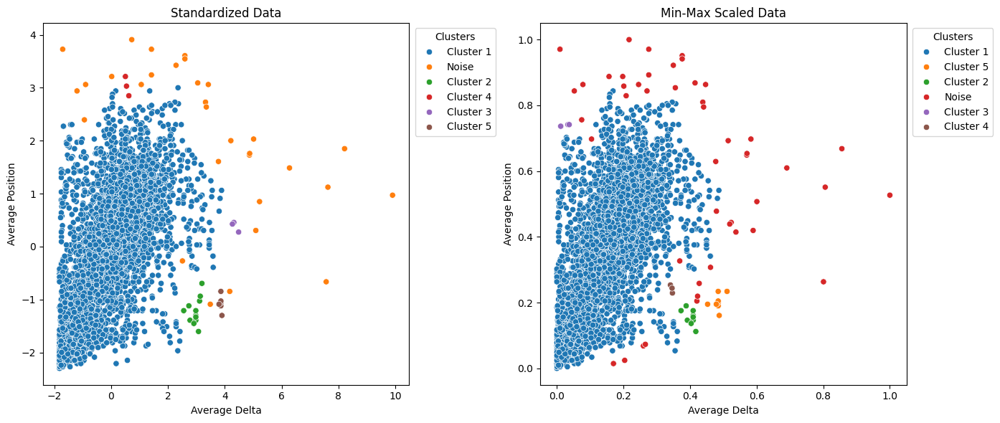

In [103]:
eps_adap = [0.3, 0.03]

# Print the used epsilon values
print(f"Epsilon for Standardized Data: {eps_adap[0]}")
print(f"Epsilon for Min-Max Scaled Data: {eps_adap[1]}")

# Apply DBSCAN clustering to the data
analyze_and_plot_dbscan(data_adap_standard.values, data_adap_minmax.values, eps_adap, min_samples=3, xlabel='Average Delta', ylabel='Average Position')

### 4. Applying DBSCAN to *points* and *race_intensity*.


--- Standardized Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.0005219886702946264
Maximum 3th distance: 0.91439575396093
Estimated epsilon (elbow point): 0.91439575396093

--- Min-Max Scaled Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.00014735924931241762
Maximum 3th distance: 0.22592719293590804
Estimated epsilon (elbow point): 0.22592719293590804


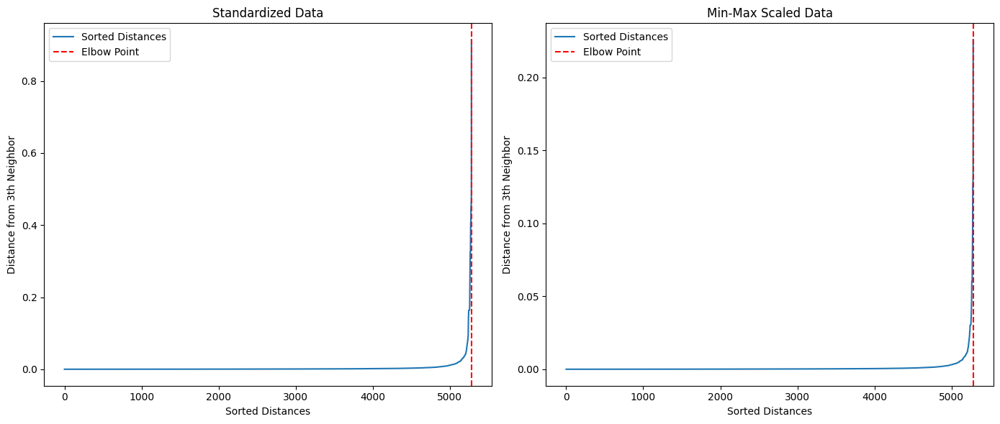

In [104]:
# analyze and plot K-NN distances for Standardized and Min-Max Scaled data for choosing the best value for eps
eps_pri = analyze_and_plot_knn(data_pri_standard.values, data_pri_minmax.values, 3)

For 'points' and 'race_intensity' it was decided to manually change the epsilon only for the data normalized with Min-Max.
In this case, there are a number of clusters that are well separated from each other for the Standardized data, while for the data treated with Min-Max there are more clusters that are still well spaced from each other.

Epsilon for Standardized Data: 0.91439575396093
Epsilon for Min-Max Scaled Data: 0.15

--- Standardized Data ---
Cluster Analysis:
Cluster 1: 4771 points
Cluster 2: 457 points
Cluster 3: 53 points
Silhouette Score: 0.5901958499162671
Cohesion (Core Points): 5281

--- Min-Max Scaled Data ---
Cluster Analysis:
Cluster 1: 4771 points
Cluster 2: 157 points
Cluster 3: 116 points
Cluster 4: 99 points
Cluster 5: 41 points
Cluster 6: 85 points
Cluster 7: 12 points
Silhouette Score: 0.3493897180779417
Cohesion (Core Points): 5280


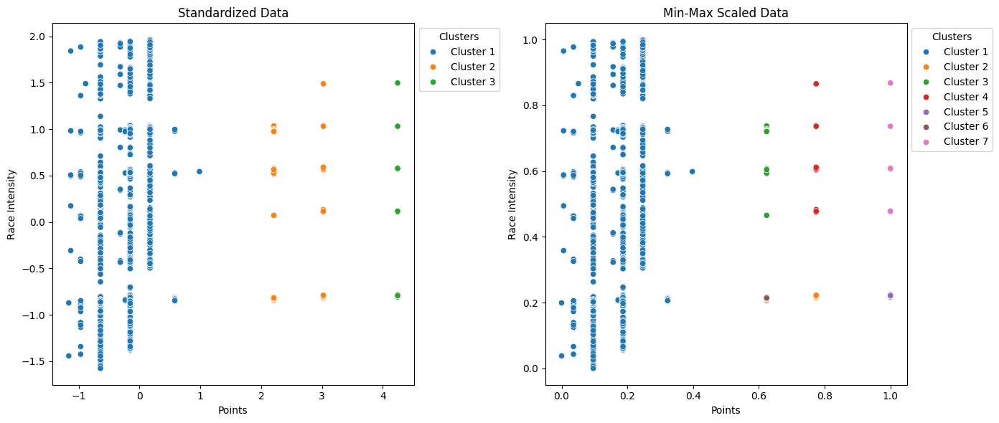

In [105]:
eps_pri[1] = 0.15

# Print the used epsilon values
print(f"Epsilon for Standardized Data: {eps_pri[0]}")
print(f"Epsilon for Min-Max Scaled Data: {eps_pri[1]}")

# Apply DBSCAN clustering to the data
analyze_and_plot_dbscan(data_pri_standard.values, data_pri_minmax.values, eps_pri, min_samples=3, xlabel='Points', ylabel='Race Intensity')

### 5. Applying DBSCAN to *points* and *startlist_quality*.


--- Standardized Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.0
Maximum 3th distance: 0.481053643256956
Estimated epsilon (elbow point): 0.4153296355060451

--- Min-Max Scaled Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.0
Maximum 3th distance: 0.09472049689440992
Estimated epsilon (elbow point): 0.07699175981136192


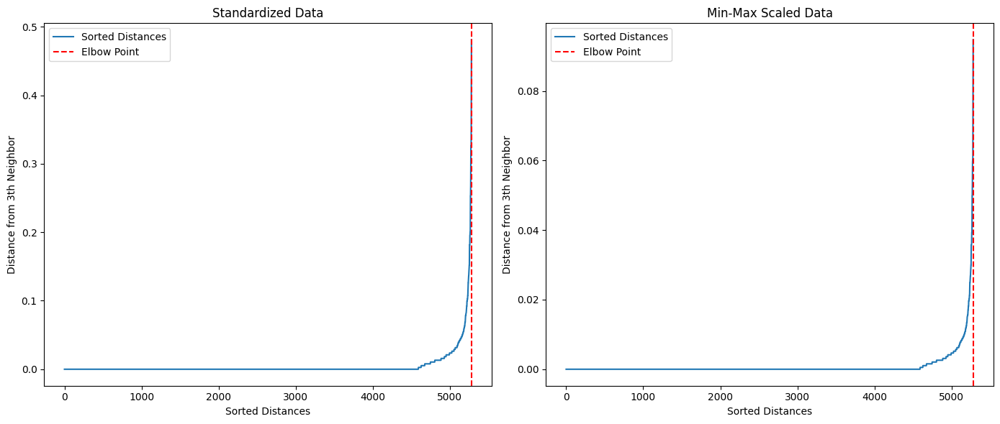

In [106]:
# analyze and plot K-NN distances for Standardized and Min-Max Scaled data for choosing the best value for eps
eps_psq = analyze_and_plot_knn(data_psq_standard.values, data_psq_minmax.values, 3)

In this case it was decided to keep the epsilon values ​​generated by the function.
These values ​​have highlighted a practically identical division of the dataframe which consists of 6 clusters without noise values, for obvious reasons also silhouette score and cohesion are equal.

Epsilon for Standardized Data: 0.4153296355060451
Epsilon for Min-Max Scaled Data: 0.07699175981136192

--- Standardized Data ---
Cluster Analysis:
Cluster 1: 4670 points
Cluster 2: 256 points
Cluster 3: 7 points
Cluster 4: 201 points
Cluster 5: 94 points
Cluster 6: 53 points
Silhouette Score: 0.2788909117456815
Cohesion (Core Points): 5280

--- Min-Max Scaled Data ---
Cluster Analysis:
Cluster 1: 4670 points
Cluster 2: 256 points
Cluster 3: 7 points
Cluster 4: 201 points
Cluster 5: 94 points
Cluster 6: 53 points
Silhouette Score: 0.26729748225607536
Cohesion (Core Points): 5280


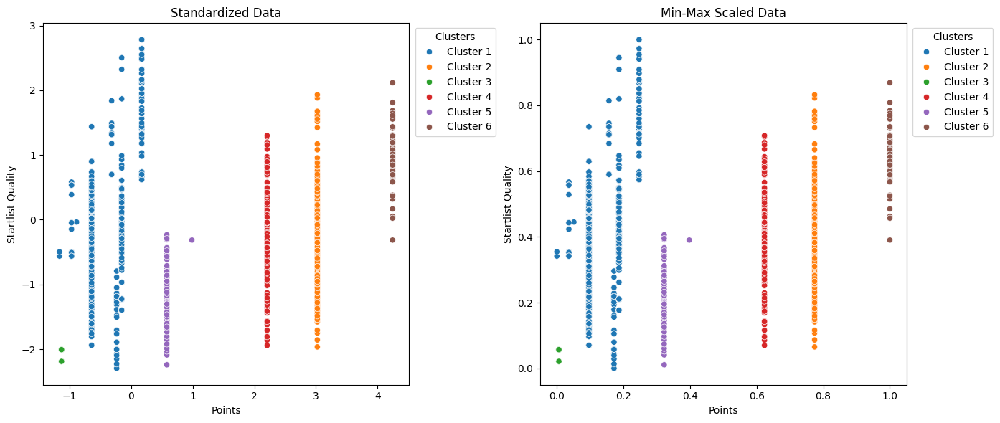

In [107]:
# Print the estimated epsilon values
print(f"Epsilon for Standardized Data: {eps_psq[0]}")
print(f"Epsilon for Min-Max Scaled Data: {eps_psq[1]}")

# Apply DBSCAN clustering to the data
analyze_and_plot_dbscan(data_psq_standard.values, data_psq_minmax.values, eps_psq, min_samples=3, xlabel='Points', ylabel='Startlist Quality')

## Hierarchical Clustering

The dendrograms provide a visualization of hierarchical clustering various methods:

1. *Complete Linkage*: this method shows clusters with a strong preference for compact groupings, as the distance between clusters is determined by their farthest points. In this case, the method has created clusters that are relatively distinct, with noticeable gaps between branches at higher linkage distances. This indicates the presence of well-separated clusters in the dataset.

2. *Single Linkage*:  in this method, clusters merge based on the closest points. This leads to an elongated structure where many points or smaller groups merge at low distances, resulting in one large cluster at higher levels. Very sensitive to  noise

3. *Average Linkage*: this methods provides a middle ground, balancing the behavior of complete and single linkage. The resulting clusters appear more uniform.

4. *Ward Linkage*: minimizes the variance within clusters at each step, resulting in highly compact and spherical clusters.

As in other clustering methods we use a function to graphically display the clustering, in this case we do it for all four methods.

In [108]:
def plot_dendrogram(data):
    methods = ['single', 'average', 'complete', 'ward']
    plt.figure(figsize=(15, 10))
    for i, method in enumerate(methods, 1):
        plt.subplot(4, 1, i)
        data_dist = pdist(data, metric='euclidean')
        data_link = linkage(data_dist, method=method)
        dendrogram(data_link, color_threshold=10, truncate_mode='lastp')
        plt.title(f'Dendrogram using {method} linkage')
    plt.tight_layout()
    plt.show()

def analyze_and_plot_hierarchical(data, x_col, y_col, n_clusters=3, xlabel=None, ylabel=None):
    """
    Creates scatter plots for different agglomerative clustering linkage methods.

    :param data: DataFrame containing the dataset.
    :param x_col: Column name for the x-axis.
    :param y_col: Column name for the y-axis.
    :param n_clusters: Number of clusters to form.
    :param xlabel: Label for the x-axis (default: same as x_col).
    :param ylabel: Label for the y-axis (default: same as y_col).
    """

    linkage_methods = ['single', 'average', 'complete', 'ward']
    
    # Create a plot for each linkage method
    plt.figure(figsize=(20, 15))
    for i, method in enumerate(linkage_methods, 1):
        # Create the clustering model
        agg_cluster = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage=method)
        
        # Copy the data to avoid modifying the original DataFrame
        temp_data = data.copy()
        temp_data['cluster'] = agg_cluster.fit_predict(temp_data[[x_col, y_col]])

        # Metrics Calculation
        cluster_labels = temp_data['cluster'].values
        if len(np.unique(cluster_labels)) > 1:
            silhouette = silhouette_score(temp_data[[x_col, y_col]], cluster_labels, metric='euclidean')
        else:
            silhouette = None  # Not defined for 1 cluster or all noise

        cohesion = sum(np.linalg.norm(temp_data[[x_col, y_col]][cluster_labels == c] - temp_data[[x_col, y_col]][cluster_labels == c].mean(axis=0)) ** 2 for c in np.unique(cluster_labels))

        # Print cluster analysis and metrics
        print(f"\n--- {method.capitalize()} Linkage ---")
        print(f"Number of clusters: {len(np.unique(cluster_labels))}")
        print(f"Silhouette Score: {silhouette if silhouette is not None else 'Not defined'}")
        print(f"Cohesion: {cohesion}")
        
        # Create the scatter plot
        plt.subplot(2, 2, i)
        sns.scatterplot(data=temp_data, x=x_col, y=y_col, hue='cluster', palette=sns.color_palette(n_colors=n_clusters))
        plt.title(f'Agglomerative Clustering with {method.capitalize()} Linkage')
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
        plt.legend(title='Cluster')

    plt.tight_layout()
    plt.show()

We also use this feature for an additional method to hierarchical clustering: divisive clustering.
For each method shown, the metrics are also calculated as in the previous cases, i.e. silhouette score and cohesion.

In [109]:
def divisive_clustering(data, max_clusters=3):
    """
    Perform divisive hierarchical clustering to create a specified number of clusters.
    
    Parameters:
    - data (numpy array): Dataset where each row is a data point.
    - max_clusters (int): Maximum number of clusters to form.
    
    Returns:
    - numpy array: Array of cluster labels for each data point.
    """

    # Start with all points in one cluster
    clusters = {0: data}
    cluster_assignments = np.zeros(data.shape[0], dtype=int)
    next_cluster_id = 1

    # Dictionary to keep track of cluster splitting hierarchy
    parent_to_children = {}

    while len(clusters) < max_clusters:
        # Find the cluster to split (largest cluster)
        largest_cluster = max(clusters, key=lambda k: len(clusters[k]))
        cluster_data = clusters.pop(largest_cluster)

        # Perform a 2-means split
        kmeans = KMeans(n_clusters=2, random_state=42)
        labels = kmeans.fit_predict(cluster_data)

        # Get indices of points in the original dataset belonging to the current cluster
        cluster_indices = np.where(cluster_assignments == largest_cluster)[0]

        # Assign new cluster IDs correctly
        child_1_id = next_cluster_id
        child_2_id = next_cluster_id + 1
        clusters[child_1_id] = cluster_data[labels == 0]
        clusters[child_2_id] = cluster_data[labels == 1]

        cluster_assignments[cluster_indices[labels == 0]] = child_1_id
        cluster_assignments[cluster_indices[labels == 1]] = child_2_id

        # Track hierarchy
        parent_to_children[largest_cluster] = (child_1_id, child_2_id)

        # Increment cluster ID for next iteration
        next_cluster_id += 2

    # Ensure consistency of cluster IDs
    return cluster_assignments

def analyze_and_plot_divisive(data1, data2, max_clusters, xlabel, ylabel):
    """
    Analyzes, computes metrics, and plots side-by-side Divisive Clustering results for two datasets.
    
    :param data1: First dataset (NumPy array with 2 columns)
    :param data2: Second dataset (NumPy array with 2 columns)
    :param max_clusters: Maximum number of clusters to create
    :param xlabel: label for x axis
    :param ylabel: label for y axis
    """

    titles = ['Standardized Data', 'Min-Max Scaled Data']

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))  # 1 row, 2 columns

    for i, (data, title, ax) in enumerate(zip([data1, data2], titles, axes)):
        # Apply divisive clustering
        cluster_labels = divisive_clustering(data, max_clusters=max_clusters)

        # Metrics Calculation
        if len(np.unique(cluster_labels)) > 1:
            silhouette = silhouette_score(data, cluster_labels, metric='euclidean')
        else:
            silhouette = None  # Not defined for 1 cluster or all noise

        cohesion = sum(np.linalg.norm(data[cluster_labels == c] - data[cluster_labels == c].mean(axis=0)) ** 2 for c in np.unique(cluster_labels))

        # Print cluster analysis and metrics
        print(f"\n--- {title} ---")
        print(f"Number of clusters: {len(np.unique(cluster_labels))}")
        for cluster_id in np.unique(cluster_labels):
            cluster_size = sum(cluster_labels == cluster_id)
            print(f"Cluster {cluster_id}: {cluster_size} points")
        print(f"Silhouette Score: {silhouette if silhouette is not None else 'Not defined'}")
        print(f"Cohesion: {cohesion}")

        # Visualization
        sns.scatterplot(
            x=data[:, 0],
            y=data[:, 1],
            hue=cluster_labels,
            palette=sns.color_palette(n_colors=max_clusters),
            ax=ax
        )

        # Customize the plot
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.set_title(title)
        ax.legend(title="Clusters", loc="upper right", bbox_to_anchor=(1.25, 1))

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()

### 1. Applying Hierarchical clustering to *weight* and *height*.

Comparing the dendrograms based on Min-Max scaled data with those using standardized data highlights how the choice of normalization method influences cluster structures. With Min-Max scaling, the dendrograms show less evident hierarchies and more fragmentation, while standardization makes distances more consistent, resulting in more distinct and well-balanced clusters.

Among the linkage methods, **single linkage** suffers from the chaining effect in both cases, connecting distant points through weak links and forming less meaningful clusters. **Average linkage** provides a balanced compromise, but **Ward linkage** delivers the best results, especially with standardized data, producing compact clusters and clear hierarchies.

Overall, standardization proves to be more suitable for this dataset, enhancing the consistency of distances and the effectiveness of clustering, particularly with the Ward method.

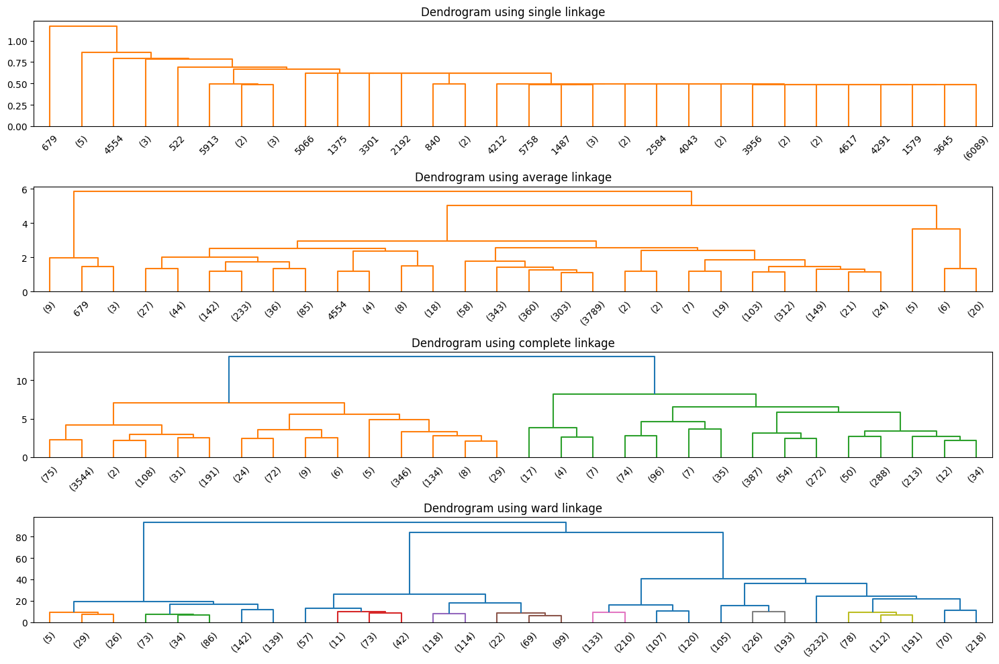

In [110]:
# Calculate distances and build dendrograms for Standardized data
plot_dendrogram(data_wh_standard)

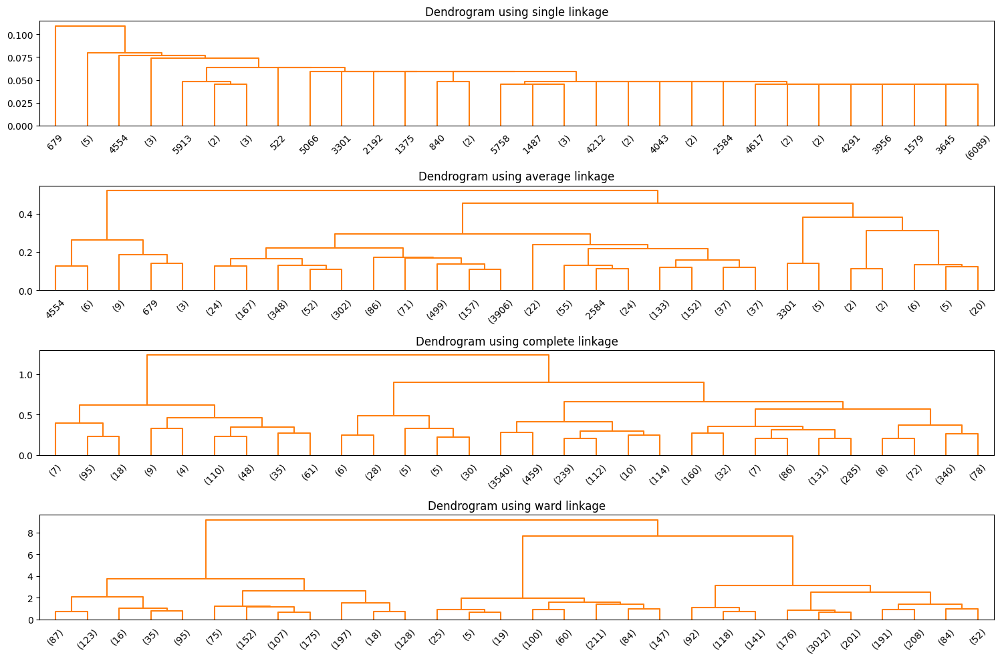

In [111]:
# Calculate distances and build dendrograms for Min-Max Scaled data
plot_dendrogram(data_wh_minmax)

As predicted by the dendrogram plot, the best method is Ward Linkage for both normalizations, obtaining excellent silhouette values ​​and minimizing cohesion, especially in the case of Min-Max


--- Single Linkage ---
Number of clusters: 3
Silhouette Score: 0.6721993952633702
Cohesion: 12099.182620530693

--- Average Linkage ---
Number of clusters: 3
Silhouette Score: 0.644039930828514
Cohesion: 11133.075306625145

--- Complete Linkage ---
Number of clusters: 3
Silhouette Score: 0.443361573696197
Cohesion: 8270.45859407639

--- Ward Linkage ---
Number of clusters: 3
Silhouette Score: 0.6220621195733449
Cohesion: 4409.794619050011


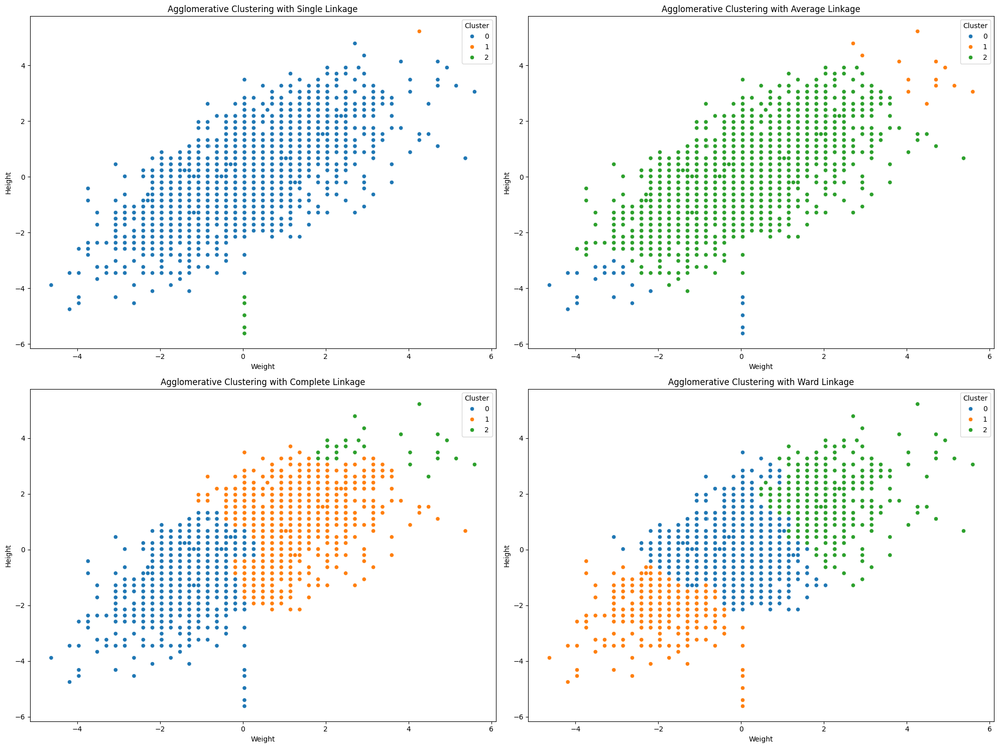

In [112]:
# Analyze and plot hierarchical clustering results for Standardized Scaled data
analyze_and_plot_hierarchical(data_wh_standard, 'weight', 'height', n_clusters=3, xlabel='Weight', ylabel='Height')


--- Single Linkage ---
Number of clusters: 3
Silhouette Score: 0.6659479061464121
Cohesion: 109.43108993112394

--- Average Linkage ---
Number of clusters: 3
Silhouette Score: 0.6307635140833766
Cohesion: 98.71348920930352

--- Complete Linkage ---
Number of clusters: 3
Silhouette Score: 0.5598969195124895
Cohesion: 69.67866023325536

--- Ward Linkage ---
Number of clusters: 3
Silhouette Score: 0.5857967043074481
Cohesion: 39.4684240358338


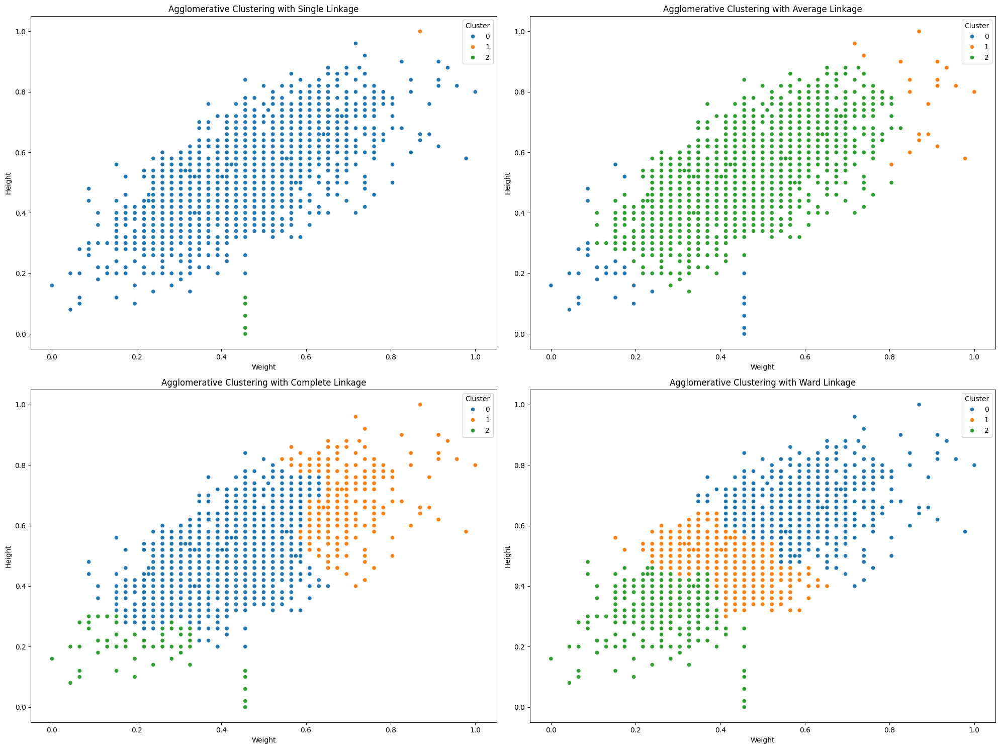

In [113]:
# Analyze and plot hierarchical clustering results for Min-Max Scaled data
analyze_and_plot_hierarchical(data_wh_minmax, 'weight', 'height', n_clusters=3, xlabel='Weight', ylabel='Height')

For the Min-Max Scaled data the divisive clustering finds these three clusters that are very near to the K-means clustering separation while StandardScore produces a less precise division of data as can be seen from the silhouette and cohesion values.


--- Standardized Data ---
Number of clusters: 3
Cluster 1: 926 points
Cluster 3: 526 points
Cluster 4: 4682 points
Silhouette Score: 0.27203663191112554
Cohesion: 7072.530233802056

--- Min-Max Scaled Data ---
Number of clusters: 3
Cluster 1: 954 points
Cluster 3: 4334 points
Cluster 4: 846 points
Silhouette Score: 0.6323992811333137
Cohesion: 35.28234977446812


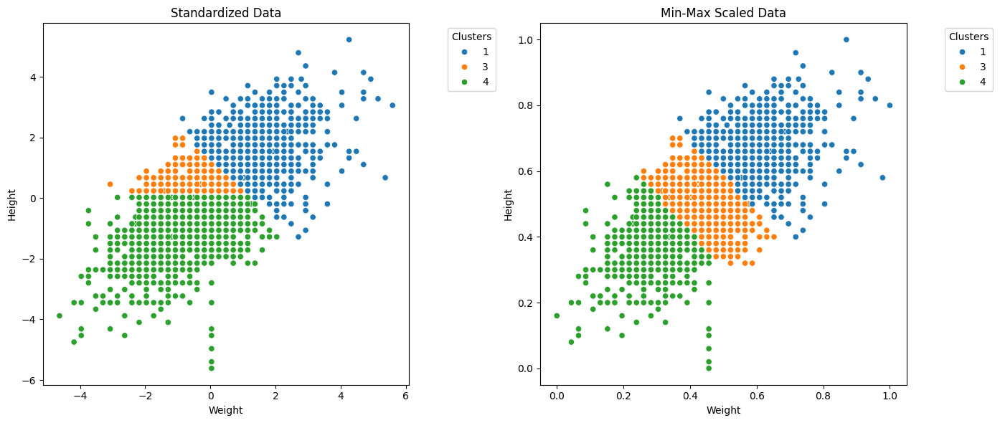

In [114]:
# Perform divisive clustering
analyze_and_plot_divisive(data_wh_standard.to_numpy(), data_wh_minmax.to_numpy(), 3, xlabel='Weight', ylabel='Height')

### 2. Applying Hierarchical clustering to *avg_position* and *bmi*.

As can be observed in the two plots, the behavior is similar to the one seen previously: **single linkage** suffers from the chain effect also in this case, **average linkage** always provides a compromise while **ward linkage** seems to have the most balanced and compact clusters.

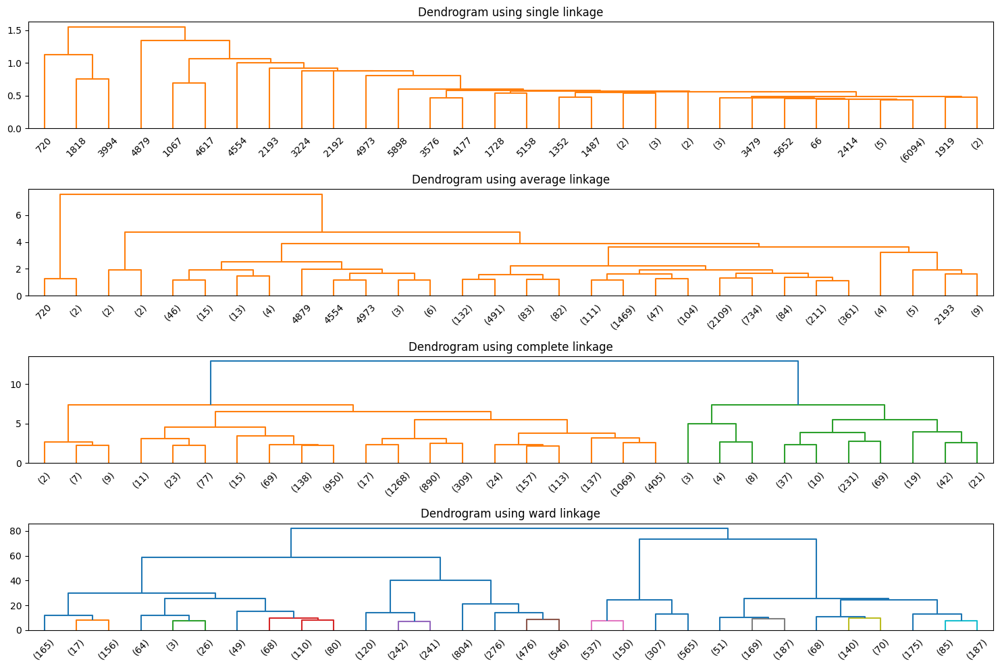

In [115]:
# Calculate distances and build dendrograms for Standardized data
plot_dendrogram(data_bap_standard)

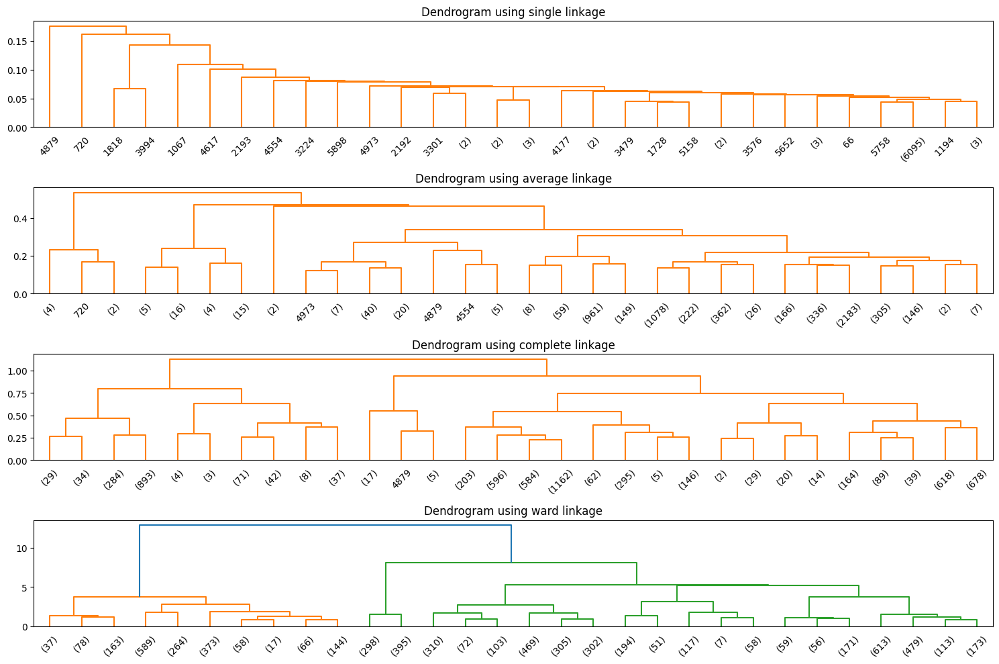

In [116]:
# Calculate distances and build dendrograms for Min-Max Scaled data
plot_dendrogram(data_bap_minmax)

Viewing these plots confirms that **ward linkage** is actually the method that divides the data set better than 'bmi' and 'avg_position'. Checking also the values ​​of silhouette and cohesion shows how the first is generally better for StandardScore while the second is for Min-Max. The number of clusters found is also highlighted, in the first case 4 while in the second 3.


--- Single Linkage ---
Number of clusters: 4
Silhouette Score: 0.7185074230069751
Cohesion: 12060.516534655033

--- Average Linkage ---
Number of clusters: 4
Silhouette Score: 0.5127740853800784
Cohesion: 10853.093868081083

--- Complete Linkage ---
Number of clusters: 4
Silhouette Score: 0.3593704725045739
Cohesion: 9510.540388438407

--- Ward Linkage ---
Number of clusters: 4
Silhouette Score: 0.3911612215733585
Cohesion: 4485.129017906434


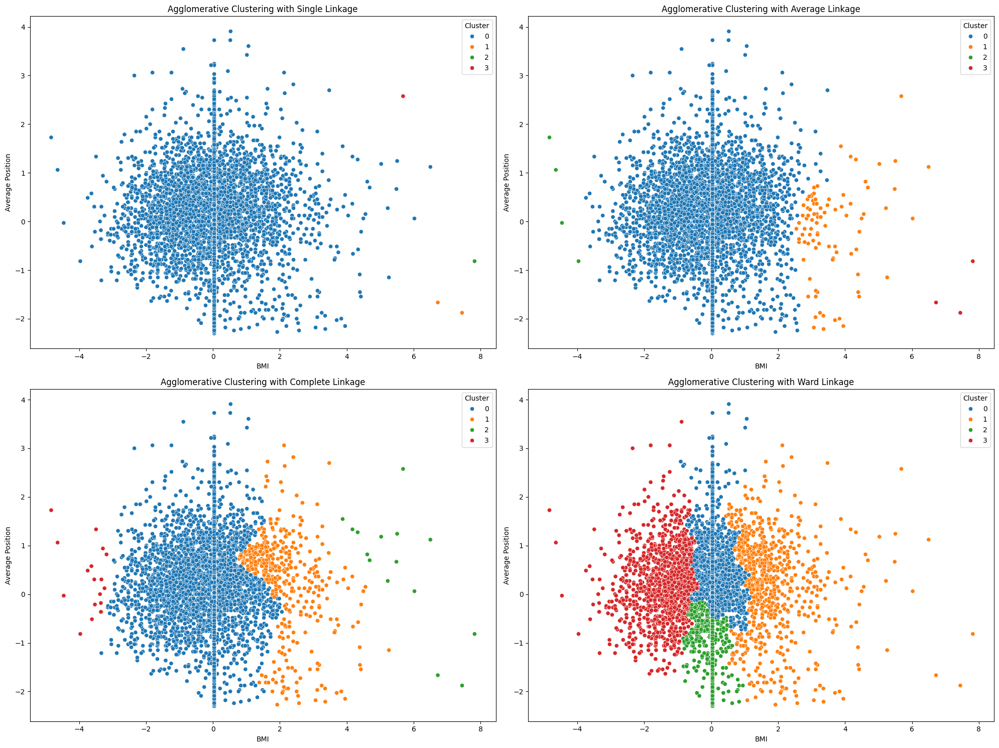

In [117]:
# Analyze and plot hierarchical clustering results for Standardized Scaled data
analyze_and_plot_hierarchical(data_bap_standard, 'bmi', 'avg_position', n_clusters=4, xlabel='BMI', ylabel='Average Position')


--- Single Linkage ---
Number of clusters: 3
Silhouette Score: 0.6144475814939968
Cohesion: 196.5604137184487

--- Average Linkage ---
Number of clusters: 3
Silhouette Score: 0.4471471399551972
Cohesion: 187.6253552873581

--- Complete Linkage ---
Number of clusters: 3
Silhouette Score: 0.37796981263723606
Cohesion: 118.12658699316088

--- Ward Linkage ---
Number of clusters: 3
Silhouette Score: 0.32590143974967317
Cohesion: 81.32621818476969


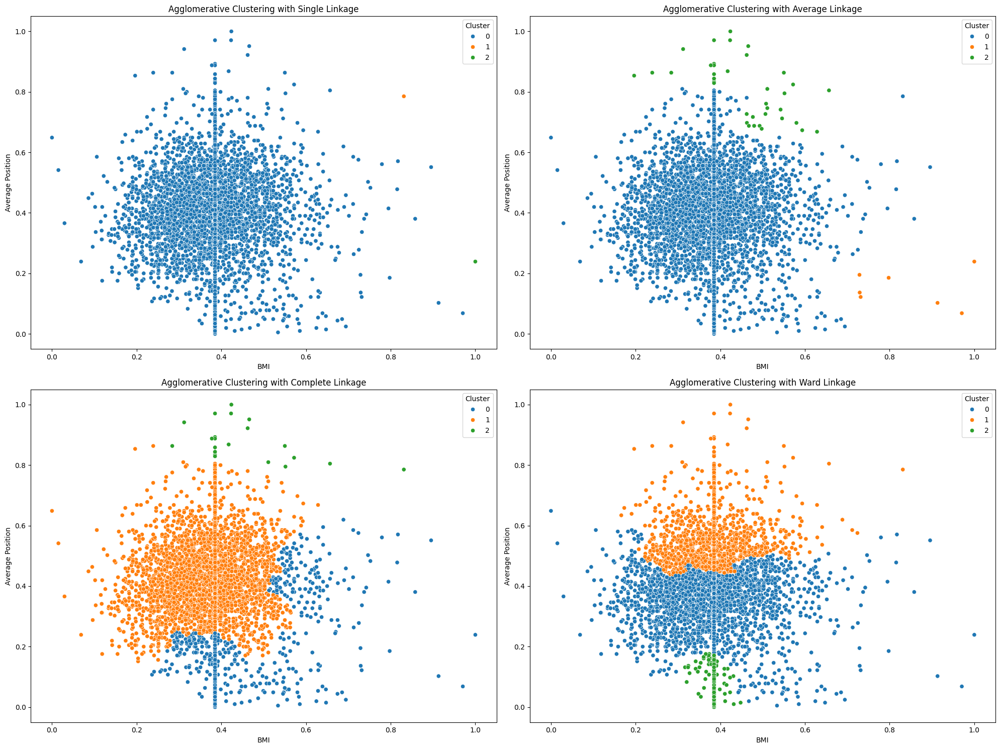

In [118]:
# Analyze and plot hierarchical clustering results for Min-Max Scaled data
analyze_and_plot_hierarchical(data_bap_minmax, 'bmi', 'avg_position', n_clusters=3, xlabel='BMI', ylabel='Average Position')

For divisive clustering, a better behavior is obtained for data treated with Min-Max as also underlined by the metrics.


--- Standardized Data ---
Number of clusters: 3
Cluster 2: 2705 points
Cluster 3: 2696 points
Cluster 4: 733 points
Silhouette Score: 0.30117504280404506
Cohesion: 6865.54569696357

--- Min-Max Scaled Data ---
Number of clusters: 3
Cluster 2: 2493 points
Cluster 3: 2486 points
Cluster 4: 1155 points
Silhouette Score: 0.3580540022849497
Cohesion: 72.74836143648156


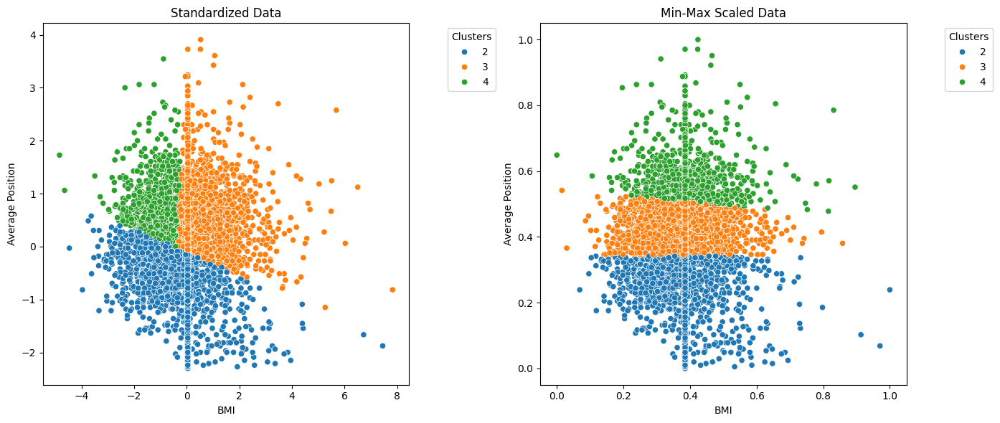

In [119]:
# Perform divisive clustering
analyze_and_plot_divisive(data_bap_standard.to_numpy(), data_bap_minmax.to_numpy(), 3, xlabel='BMI', ylabel='Average Position')

### 3. Applying Hierarchical clustering to *avg_delta* and *avg_position*.

Once again, we see an increasing improvement in the methods shown, starting from **single linkage** which is the worst due to the chain effect, up to **ward linkage** which generates more balanced and compact clusters.

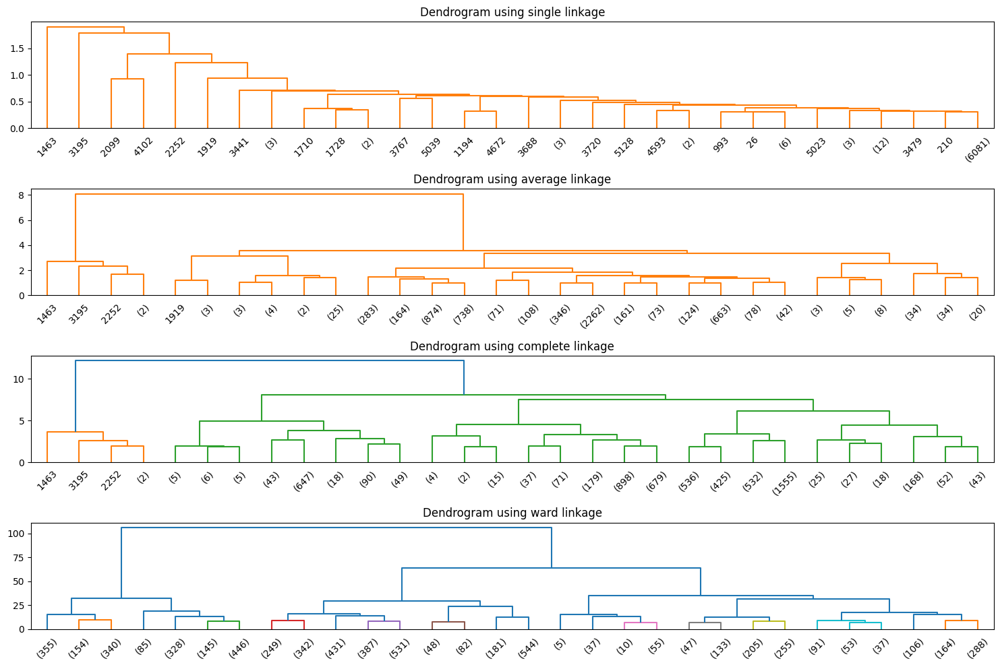

In [120]:
# Calculate distances and build dendrograms for Standardized data
plot_dendrogram(data_adap_standard)

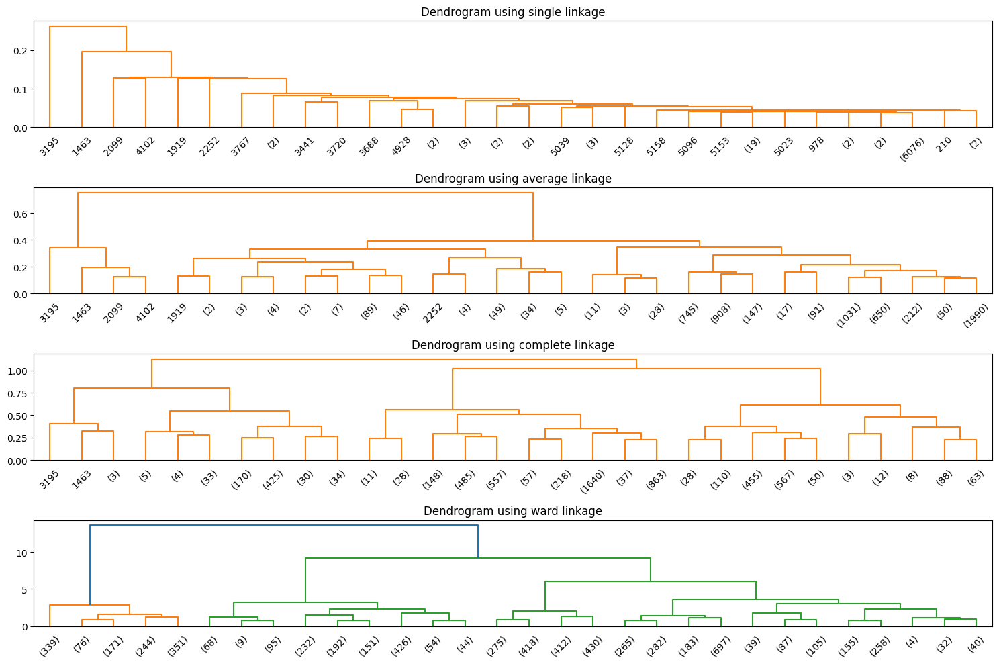

In [121]:
# Calculate distances and build dendrograms for Min-Max Scaled data
plot_dendrogram(data_adap_minmax)

Focusing on analyzing only the best result (**ward linkage**) we notice how in this case the separation provided for the data scaled with StandardScore is not precise while for Min-Max there is a division on rows that is already clearer but is disturbed by the outlier values ​​of 'avg_delta'.


--- Single Linkage ---
Number of clusters: 3
Silhouette Score: 0.774018205141638
Cohesion: 12111.176359565949

--- Average Linkage ---
Number of clusters: 3
Silhouette Score: 0.48861524295077546
Cohesion: 11548.488257175726

--- Complete Linkage ---
Number of clusters: 3
Silhouette Score: 0.33870150893341944
Cohesion: 8625.30904981181

--- Ward Linkage ---
Number of clusters: 3
Silhouette Score: 0.3545533439629326
Cohesion: 4615.76129903037


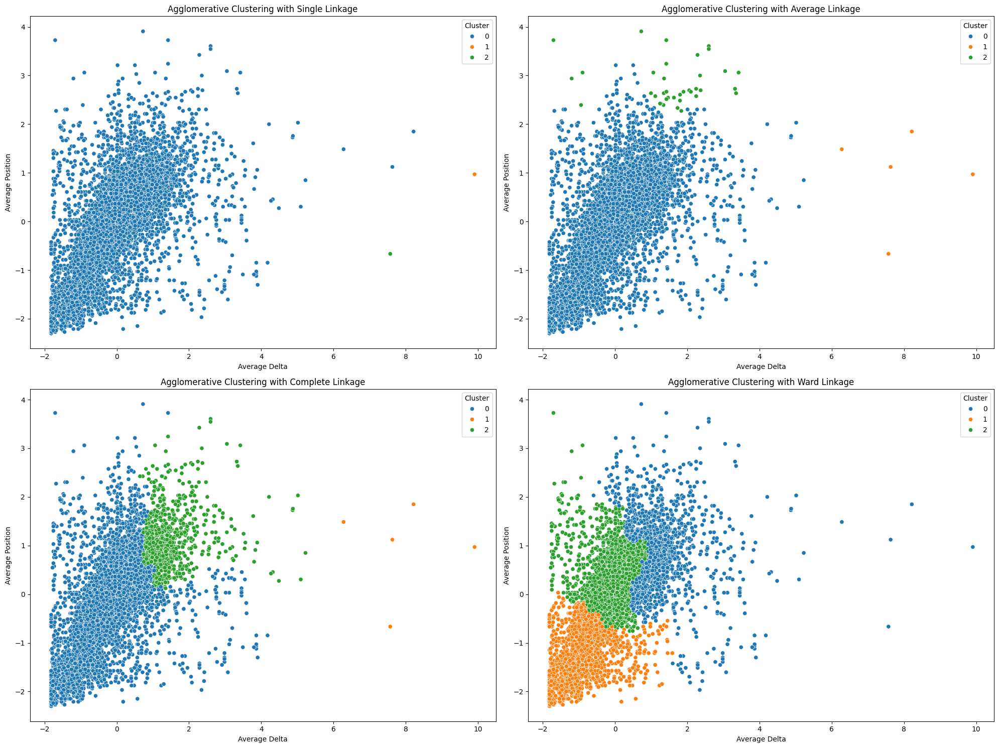

In [122]:
# Analyze and plot hierarchical clustering results for Standardized Scaled data
analyze_and_plot_hierarchical(data_adap_standard, 'avg_delta', 'avg_position', n_clusters=3, xlabel='Average Delta', ylabel='Average Position')


--- Single Linkage ---
Number of clusters: 3
Silhouette Score: 0.6777942652591094
Cohesion: 202.52450906720503

--- Average Linkage ---
Number of clusters: 3
Silhouette Score: 0.43268900103273283
Cohesion: 174.66658963647237

--- Complete Linkage ---
Number of clusters: 3
Silhouette Score: 0.3057971337112966
Cohesion: 97.30268486605601

--- Ward Linkage ---
Number of clusters: 3
Silhouette Score: 0.3679619894425646
Cohesion: 69.59818387216372


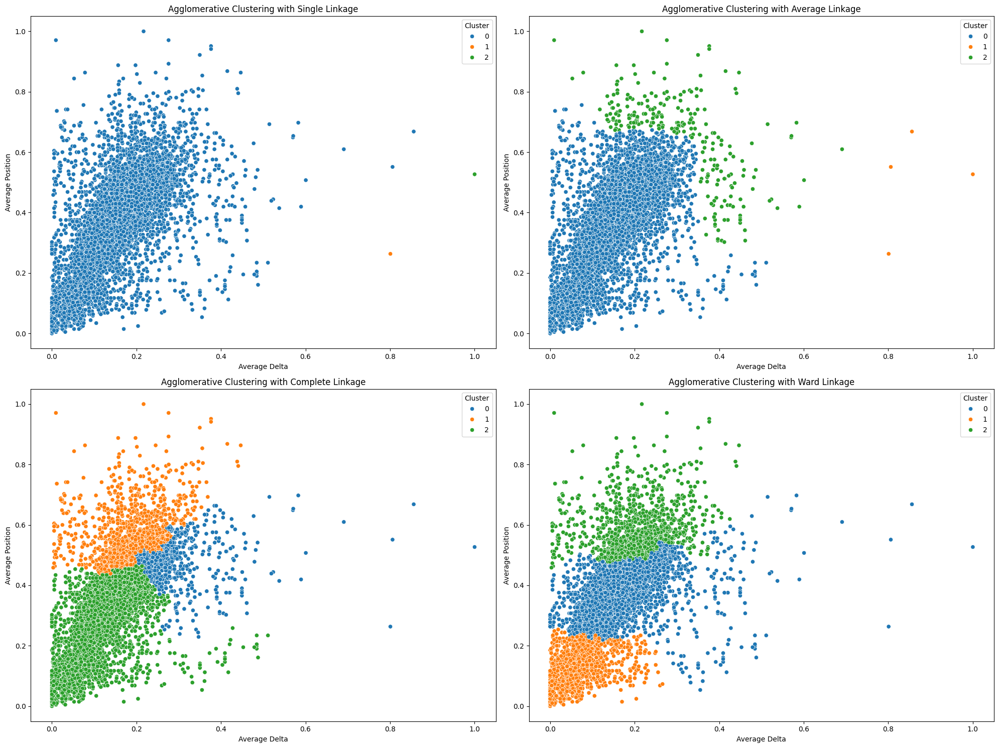

In [123]:
# Analyze and plot hierarchical clustering results for Min-Max Scaled data
analyze_and_plot_hierarchical(data_adap_minmax, 'avg_delta', 'avg_position', n_clusters=3, xlabel='Average Delta', ylabel='Average Position')

The two graphs shown are very different in appearance, looking at the metrics the first one is definitely the worst despite the good distribution of values. Among all the hierarchical methods seen the divisive one on Min-Max is the best.


--- Standardized Data ---
Number of clusters: 3
Cluster 2: 2784 points
Cluster 3: 969 points
Cluster 4: 2381 points
Silhouette Score: 0.3639379123521857
Cohesion: 4714.099154335341

--- Min-Max Scaled Data ---
Number of clusters: 3
Cluster 2: 2622 points
Cluster 3: 1141 points
Cluster 4: 2371 points
Silhouette Score: 0.3806286108720457
Cohesion: 66.1018129259414


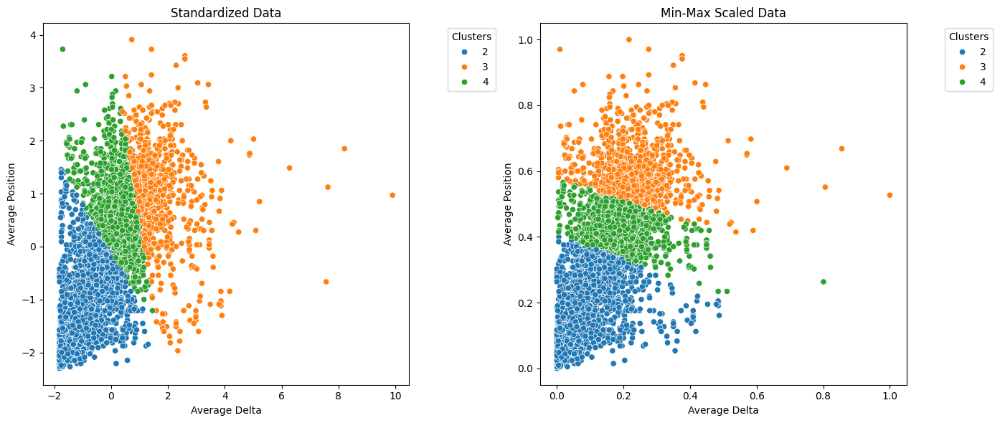

In [124]:
# Perform divisive clustering
analyze_and_plot_divisive(data_adap_standard.to_numpy(), data_adap_minmax.to_numpy(), 3, xlabel='Average Delta', ylabel='Average Position')

### 4. Applying Hierarchical clustering to *points* and *race_intensity*.

For 'points' and 'race_intesity' using normalization with StandardScore we have **single_linkage** which does not suffer excessively from the chain effect, the other methods perform progressively better with **ward linkage** which once again turns out to be the best.


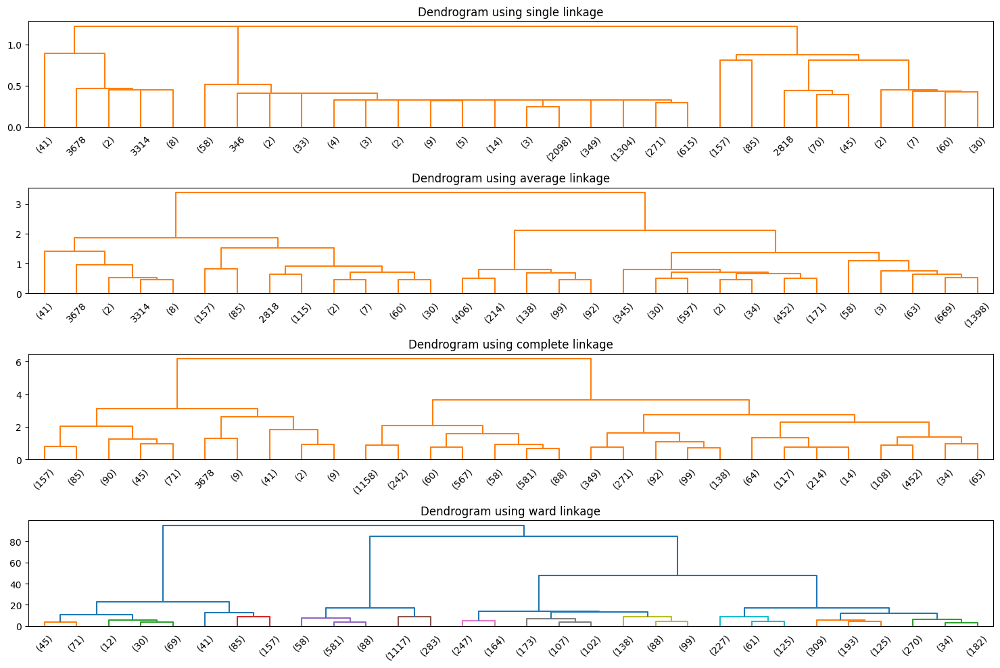

In [125]:
# Calculate distances and build dendrograms for Standardized data
plot_dendrogram(data_pri_standard)

For Min-Max, however, there is still enough chain effect in **single linkage**.

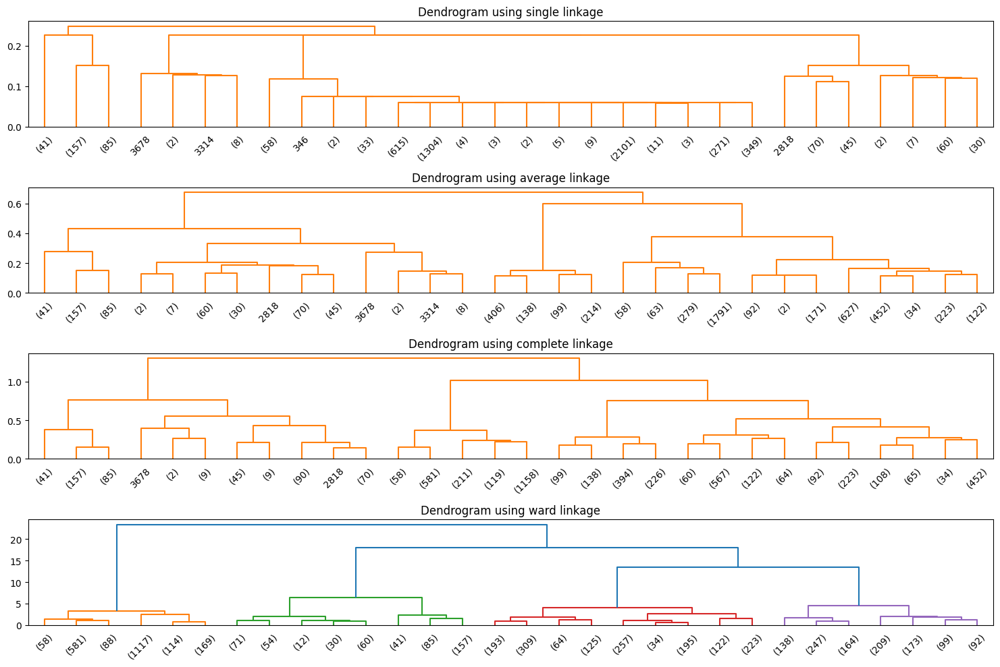

In [126]:
# Calculate distances and build dendrograms for Min-Max Scaled data
plot_dendrogram(data_pri_minmax)

In all cases three clusters are identified, we highlight how in general visually Standard Score seems to behave better: **single linkage** divides very well into columns while the other three methods tend to group what in **single linkage** are clusters 0 and 1 into a single cluster, separating cluster 2 instead.


--- Single Linkage ---
Number of clusters: 3
Silhouette Score: 0.5901958499162671
Cohesion: 5904.014666067222

--- Average Linkage ---
Number of clusters: 3
Silhouette Score: 0.5511817104374482
Cohesion: 2841.097109552227

--- Complete Linkage ---
Number of clusters: 3
Silhouette Score: 0.5552742032182395
Cohesion: 2406.344889571589

--- Ward Linkage ---
Number of clusters: 3
Silhouette Score: 0.5750548487735799
Cohesion: 2427.315333761594


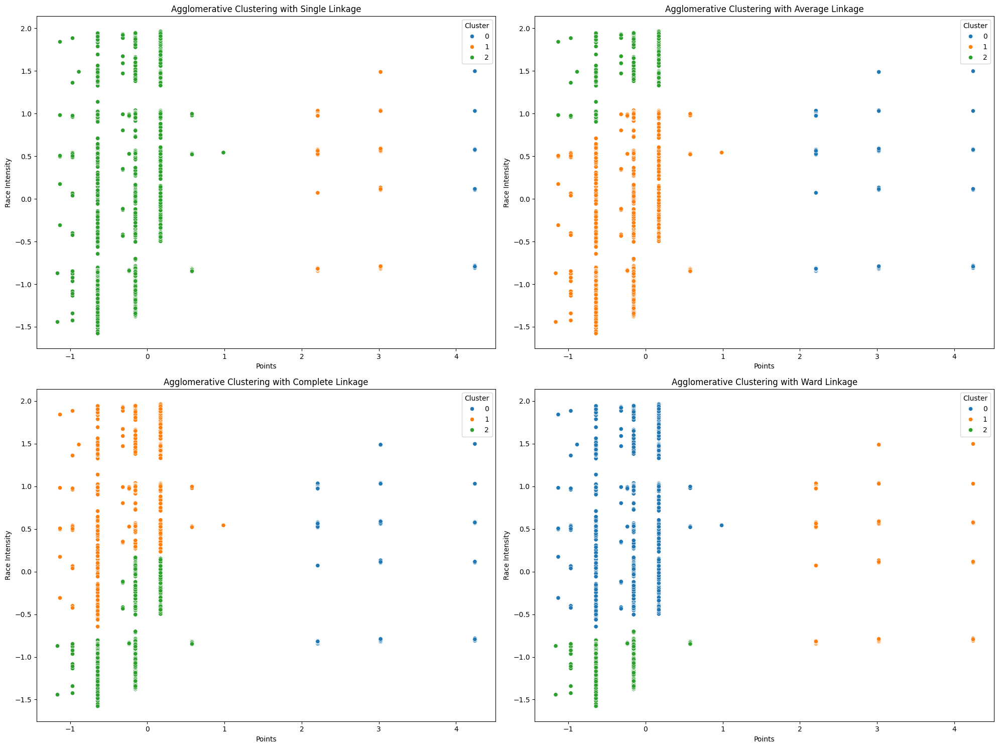

In [127]:
# Analyze and plot hierarchical clustering results for Standardized Scaled data
analyze_and_plot_hierarchical(data_pri_standard, 'points','race_intensity', n_clusters=3, xlabel='Points', ylabel='Race Intensity')


--- Single Linkage ---
Number of clusters: 3
Silhouette Score: 0.4662497357268779
Cohesion: 488.23435202122516

--- Average Linkage ---
Number of clusters: 3
Silhouette Score: 0.5503401599212269
Cohesion: 201.24818741370194

--- Complete Linkage ---
Number of clusters: 3
Silhouette Score: 0.5921203010075597
Cohesion: 162.90649498088771

--- Ward Linkage ---
Number of clusters: 3
Silhouette Score: 0.5921203010075597
Cohesion: 162.90649498088771


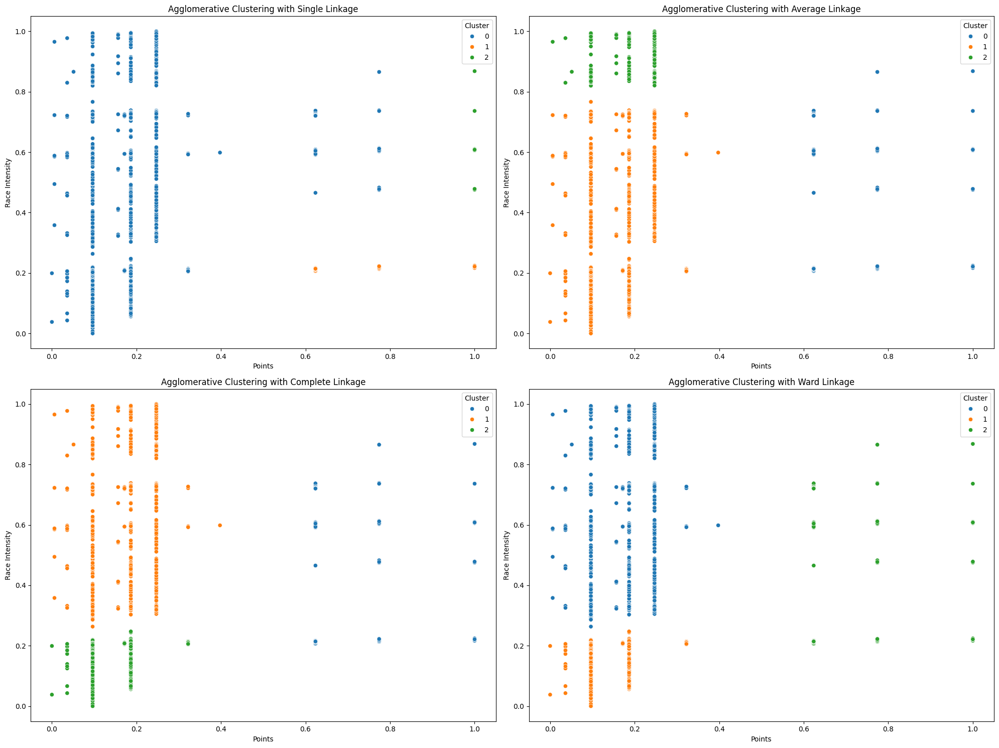

In [128]:
# Analyze and plot hierarchical clustering results for Min-Max Scaled data
analyze_and_plot_hierarchical(data_pri_minmax, 'points','race_intensity', n_clusters=3, xlabel='Points', ylabel='Race Intensity')

In divisive clustering, two very similar graphs are obtained for both normalizations, completely different from those seen previously.


--- Standardized Data ---
Number of clusters: 3
Cluster 2: 2060 points
Cluster 3: 2938 points
Cluster 4: 283 points
Silhouette Score: 0.5254713632998848
Cohesion: 3667.3962740950838

--- Min-Max Scaled Data ---
Number of clusters: 3
Cluster 2: 2630 points
Cluster 3: 2368 points
Cluster 4: 283 points
Silhouette Score: 0.5666431751726485
Cohesion: 187.38268354399204


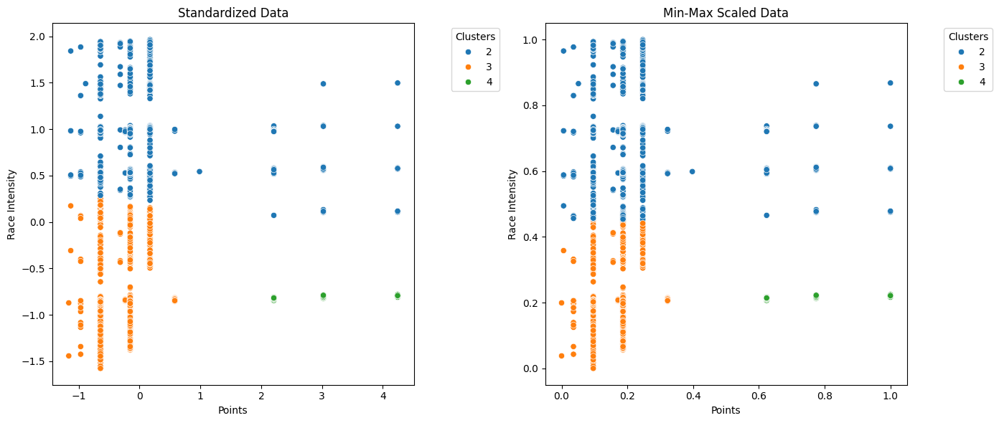

In [129]:
# Perform divisive clustering
analyze_and_plot_divisive(data_pri_standard.to_numpy(), data_pri_minmax.to_numpy(), 3, xlabel='Points', ylabel='Race Intensity')

### 5. Applying Hierarchical clustering to *points* and *startlist_quality*.

For this last pair of features, it can be noted that the dendrograms do not present a chain effect, generating, more or less, homogeneous and compact clusters.

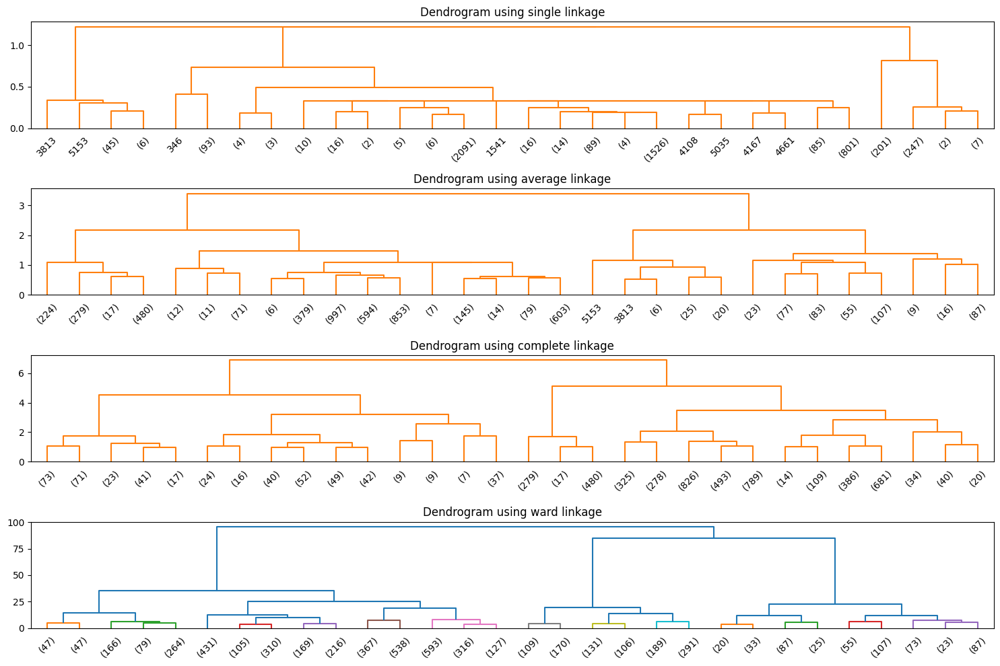

In [130]:
# Calculate distances and build dendrograms for Standardized data
plot_dendrogram(data_psq_standard)

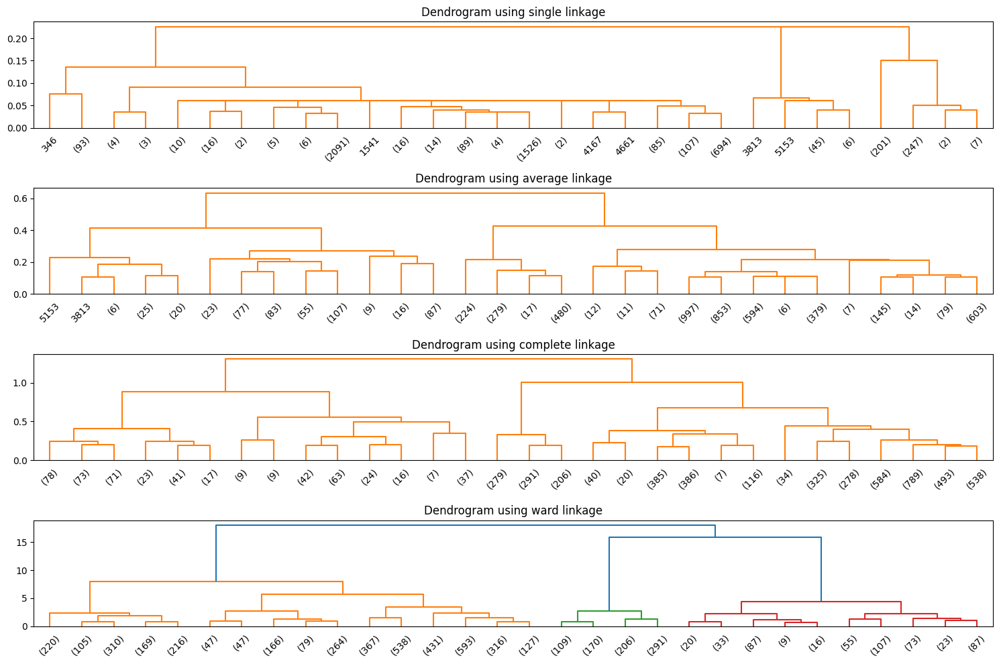

In [131]:
# Calculate distances and build dendrograms for Min-Max Scaled data
plot_dendrogram(data_psq_minmax)

Visually the best division seems to be that provided by **single linkage** and **average linkage** for the standardized data and that provided by **single linkage** for the Min-Max scaled data. The silhouette values ​​are all very similar (underlining what the dendrograms showed) and the cohesion is as expected better among the Min-Max scaled data.


--- Single Linkage ---
Number of clusters: 3
Silhouette Score: 0.6114740312302258
Cohesion: 5830.2756467345225

--- Average Linkage ---
Number of clusters: 3
Silhouette Score: 0.6114740312302258
Cohesion: 5830.2756467345225

--- Complete Linkage ---
Number of clusters: 3
Silhouette Score: 0.6304009495705083
Cohesion: 2587.0620861729144

--- Ward Linkage ---
Number of clusters: 3
Silhouette Score: 0.6263786077466259
Cohesion: 2416.214104429758


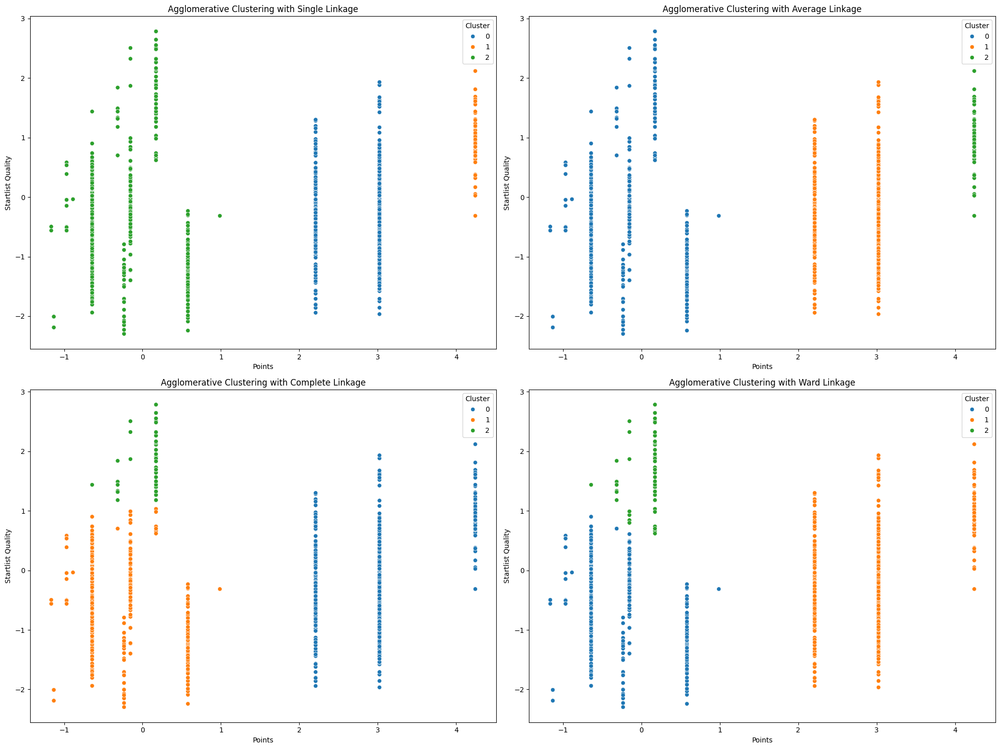

In [132]:
# Analyze and plot hierarchical clustering results for Standardized Scaled data
analyze_and_plot_hierarchical(data_psq_standard, 'points','startlist_quality', n_clusters=3, xlabel='Points', ylabel='Startlist Quality')


--- Single Linkage ---
Number of clusters: 3
Silhouette Score: 0.5959841338044208
Cohesion: 223.08114001524726

--- Average Linkage ---
Number of clusters: 3
Silhouette Score: 0.6263544454865044
Cohesion: 91.23888133007395

--- Complete Linkage ---
Number of clusters: 3
Silhouette Score: 0.6310604479516675
Cohesion: 97.69974999701809

--- Ward Linkage ---
Number of clusters: 3
Silhouette Score: 0.6310604479516675
Cohesion: 97.69974999701809


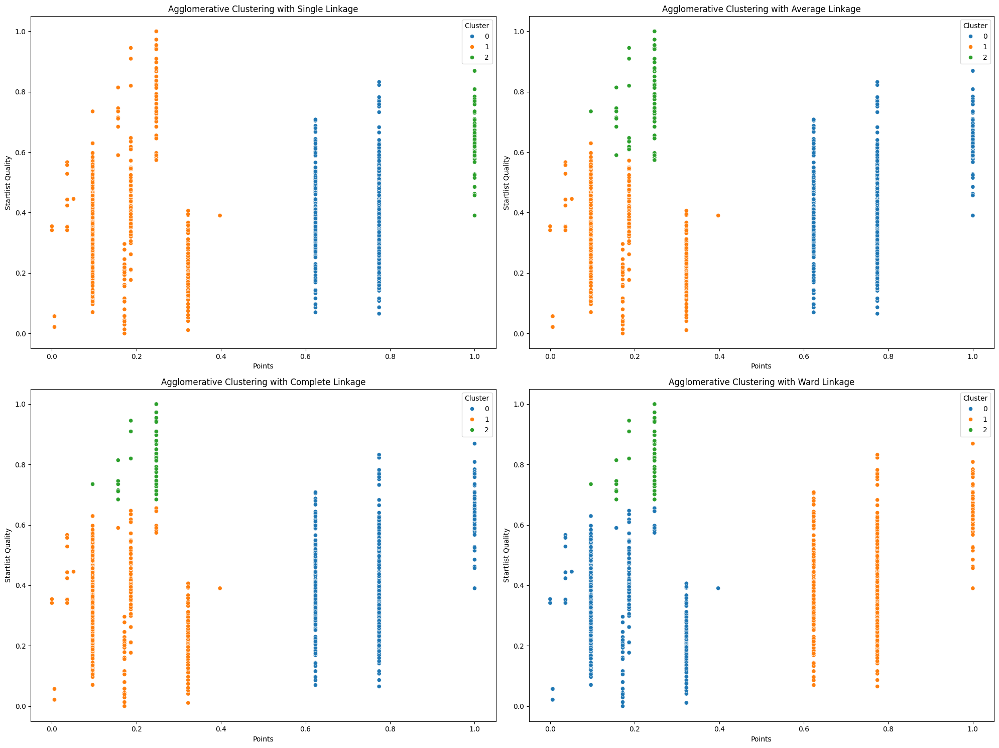

In [133]:
# Analyze and plot hierarchical clustering results for Min-Max Scaled data
analyze_and_plot_hierarchical(data_psq_minmax, 'points','startlist_quality', n_clusters=3, xlabel='Points', ylabel='Startlist Quality')

Even this time we have two very similar plots for the divisive clustering, the silhouette values ​​are low and therefore the division is not very effective.


--- Standardized Data ---
Number of clusters: 3
Cluster 2: 1478 points
Cluster 3: 2420 points
Cluster 4: 1383 points
Silhouette Score: 0.3694997697705227
Cohesion: 5168.21876685056

--- Min-Max Scaled Data ---
Number of clusters: 3
Cluster 2: 1490 points
Cluster 3: 1368 points
Cluster 4: 2423 points
Silhouette Score: 0.37528017582406276
Cohesion: 186.91386728391186


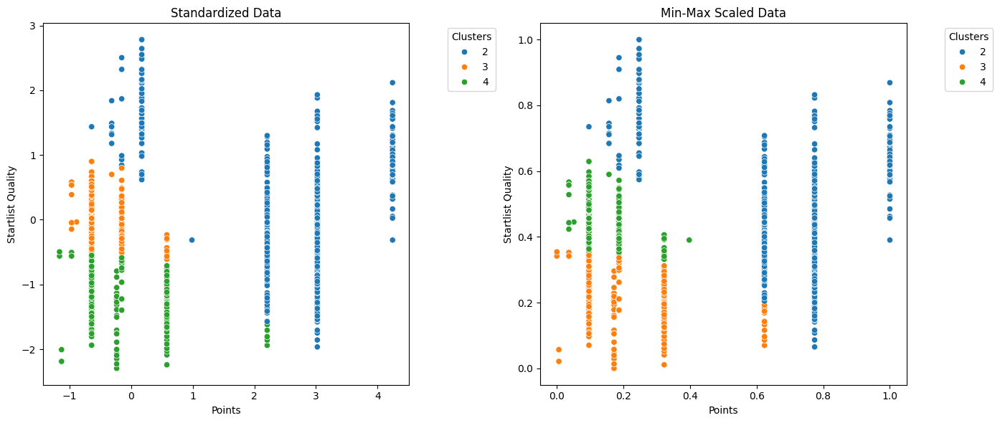

In [134]:
# Perform divisive clustering
analyze_and_plot_divisive(data_psq_standard.to_numpy(), data_psq_minmax.to_numpy(), 3, xlabel='Points', ylabel='Startlist Quality')

## Additional Clusterings


### OPTICS Clustering

OPTICS (Ordering Points To Identify the Clustering Structure) is a density-based clustering algorithm. It is designed to identify clusters of varying densities in a dataset by analyzing the density-reachability of points.

For each point, the algorithm calculates the *core distance*, which is the minimum distance needed to consider that point as a core point, given a certain **radius** parameter. The *reachability distance* (**neighbors**) of a point is the distance needed to reach it from a core point. This helps determine how reachable a point is from others in its vicinity. OPTICS processes all points in the dataset and orders them based on reachability distance, which helps create a structure for visualizing the clustering. This ordering enables the detection of clusters at different density levels. By analyzing the reachability plot, clusters are identified as valleys (low-reachability regions), while noise points and outliers are detected as those with high reachability distances.

OPTICS is especially useful for identifying clusters with different shapes and densities, making it more flexible than DBSCAN for complex datasets.

In [135]:
def analyze_and_plot_optics(data1, data2, radius, min_neighbors, xlabel, ylabel):
    """
    Analyzes, computes metrics, and plots side-by-side OPTICS clustering results for two datasets.
    
    :param data1: First dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param data2: Second dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param radius: Maximum distance to consider points in the same cluster (Array of 2 floats)
    :param min_neighbors: Minimum number of points to form a cluster (Array of 2 integers)
    :param xlabel: label for x axis
    :param ylabel: label for y axis
    """

    titles=["OPTICS Clustering - Standardized Data", "OPTICS Clustering - Min-Max Scaled Data"]

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))  # 1 row, 2 columns

    for i, (data, rad, min_neig, title, ax) in enumerate(zip([data1, data2], radius, min_neighbors, titles, axes)):
        # Initialize and process OPTICS
        optics_instance = optics(data.tolist(), rad, min_neig)
        _, result = timedcall(optics_instance.process)

        # Extract clusters and noise
        clusters = optics_instance.get_clusters()
        noise = optics_instance.get_noise()

        # Prepare labels for silhouette score
        labels = np.full(data.shape[0], -1)  # Start with all noise (-1)
        for cluster_id, cluster_points in enumerate(clusters):
            labels[cluster_points] = cluster_id

        # Metrics Calculation
        num_clusters = len(clusters)
        if num_clusters > 1:
            silhouette = silhouette_score(data, labels, metric='euclidean')
        else:
            silhouette = None  # Not defined for 1 cluster or all noise

        cohesion = sum(len(cluster) for cluster in clusters)

        # Print cluster analysis and metrics
        print(f"\n--- {title} ---")
        print("Cluster Analysis:")
        for cluster_id, cluster in enumerate(clusters):
            print(f"Cluster {cluster_id}: {len(cluster)} points")
        print(f"Noise: {len(noise)} points")
        print(f"Silhouette Score: {silhouette if silhouette is not None else 'Not defined'}")
        print(f"Cohesion (Total Points in Clusters): {cohesion}")

        # Visualization
        colors = sns.color_palette("tab10", len(clusters) + 1)
        for cluster_id, cluster_points in enumerate(clusters):
            cluster_data = data[np.array(cluster_points, dtype=int)]
            ax.scatter(cluster_data[:, 0], cluster_data[:, 1], label=f'Cluster {cluster_id}', color=colors[cluster_id])

        # Plot noise points
        noise_data = data[np.array(noise, dtype=int)]
        ax.scatter(noise_data[:, 0], noise_data[:, 1], color='red', marker='x', label='Noise')

        # Customize the plot
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.set_title(title)
        ax.legend(title="Clusters", loc="upper right", bbox_to_anchor=(1.25, 1))

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()

### 1. Applyting OPTICS to *weight* and *height*

The two graphs shown are very similar, the radius provided to each has been manually balanced to highlight a large main cluster while excluding the outer values ​​as noise.


--- OPTICS Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 6063 points
Noise: 71 points
Silhouette Score: Not defined
Cohesion (Total Points in Clusters): 6063

--- OPTICS Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 6068 points
Noise: 66 points
Silhouette Score: Not defined
Cohesion (Total Points in Clusters): 6068


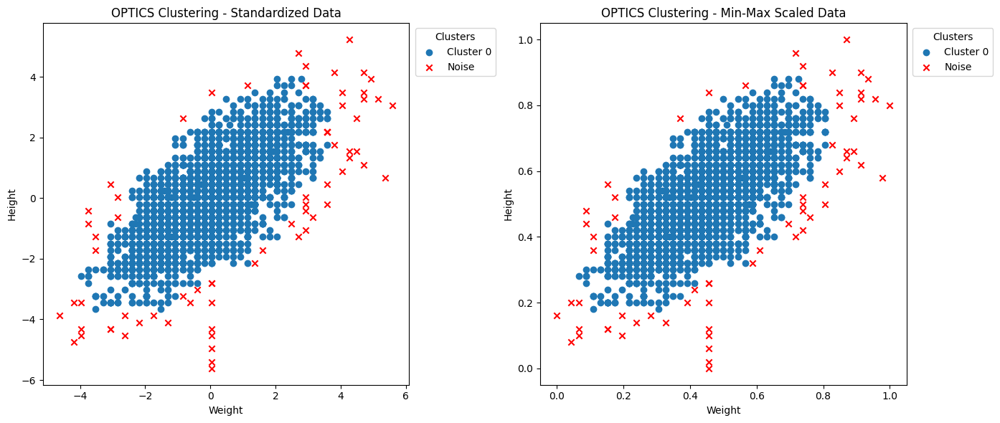

In [136]:
# Normalize the 'weight' and 'height' columns
data_wh_standard, data_wh_minmax = normalize_data(cyclists[['weight', 'height']], ['weight', 'height'])

# OPTICS algorithm parameters
radius = [0.4, 0.04]  # Maximum distance to consider points in the same cluster
neighbors = [5,5]  # Minimum number of points to form a cluster

# Apply OPTICS clustering to the data
analyze_and_plot_optics(data_wh_standard.values, data_wh_minmax.values, radius, neighbors, 'Weight', 'Height')


### 2. Applyting OPTICS to *bmi* and *avg_position*

For the *bmi* and *position* we decide to use the same *radius* and *neighbors* values used before.

There is always a large cluster for both normalizations, a small cluster is generated in the standardized data and two clusters for the Min-Max scaled data.


--- OPTICS Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 6075 points
Cluster 1: 6 points
Noise: 53 points
Silhouette Score: 0.5500083047855183
Cohesion (Total Points in Clusters): 6081

--- OPTICS Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 6063 points
Cluster 1: 4 points
Cluster 2: 2 points
Noise: 65 points
Silhouette Score: 0.24186220863027574
Cohesion (Total Points in Clusters): 6069


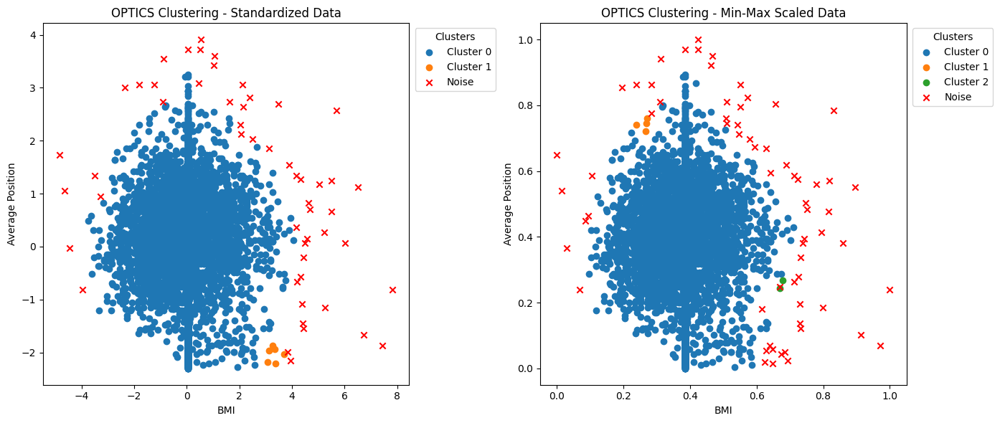

In [137]:
# Normalize the 'bmi' and 'avg_position' columns
data_bap_standard, data_bap_minmax = normalize_data(cyclists[['bmi', 'avg_position']], ['bmi', 'avg_position'])

# OPTICS algorithm parameters
radius = [0.4, 0.04]  # Maximum distance to consider points in the same cluster
neighbors = [5,5]  # Minimum number of points to form a cluster

# Apply OPTICS clustering to the data
analyze_and_plot_optics(data_bap_standard.values, data_bap_minmax.values, radius, neighbors, 'BMI', 'Average Position')

### 3. Applying OPTICS to *avg_delta* and *avg_position*.

In the *avg_delta* and *avg_position* case we use the same *radius* and *neighbors* values used before.

We have a single big cluster for the Standardize data. In the Min-Max scaled there are two very small cluster in addition to the main one.


--- OPTICS Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 6105 points
Noise: 29 points
Silhouette Score: Not defined
Cohesion (Total Points in Clusters): 6105

--- OPTICS Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 6071 points
Cluster 1: 10 points
Cluster 2: 9 points
Noise: 44 points
Silhouette Score: 0.38369509807169416
Cohesion (Total Points in Clusters): 6090


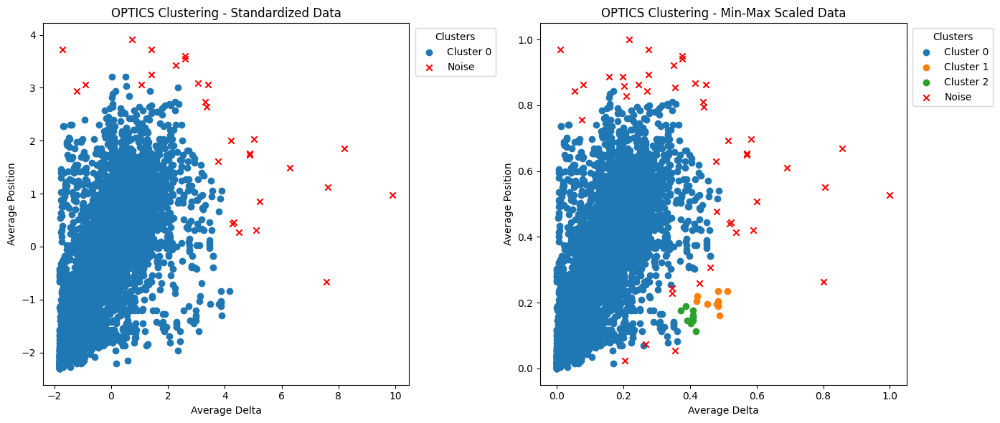

In [138]:
# Normalize the 'avg_delta' and 'avg_position' columns
data_adap_standard, data_adap_minmax = normalize_data(cyclists[['avg_delta', 'avg_position']], ['avg_delta', 'avg_position'])

# OPTICS algorithm parameters
radius = [0.4, 0.04]  # Maximum distance to consider points in the same cluster
neighbors = [5,5]  # Minimum number of points to form a cluster

# Apply OPTICS clustering to the data
analyze_and_plot_optics(data_adap_standard.values, data_adap_minmax.values, radius, neighbors, 'Average Delta', 'Average Position')

### 4. Applying OPTICS to *points* and *race_intensity*.

For 'points' and 'startlist_quality' we use *radius*=0.5 and *neighbors*=0.1.

Due to the distribution of the data there is a large cluster in both normalizations.
In the first graph we can see how there are 6 other smaller clusters with no noise value. In the second one instead the clusters found are 10 also finding 7 noise points.


--- OPTICS Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 4713 points
Cluster 1: 157 points
Cluster 2: 116 points
Cluster 3: 99 points
Cluster 4: 41 points
Cluster 5: 85 points
Cluster 6: 58 points
Cluster 7: 12 points
Noise: 0 points
Silhouette Score: 0.17252312033404213
Cohesion (Total Points in Clusters): 5281

--- OPTICS Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 4713 points
Cluster 1: 157 points
Cluster 2: 45 points
Cluster 3: 30 points
Cluster 4: 41 points
Cluster 5: 70 points
Cluster 6: 85 points
Cluster 7: 58 points
Cluster 8: 60 points
Cluster 9: 8 points
Cluster 10: 7 points
Noise: 7 points
Silhouette Score: 0.005885903834451437
Cohesion (Total Points in Clusters): 5274


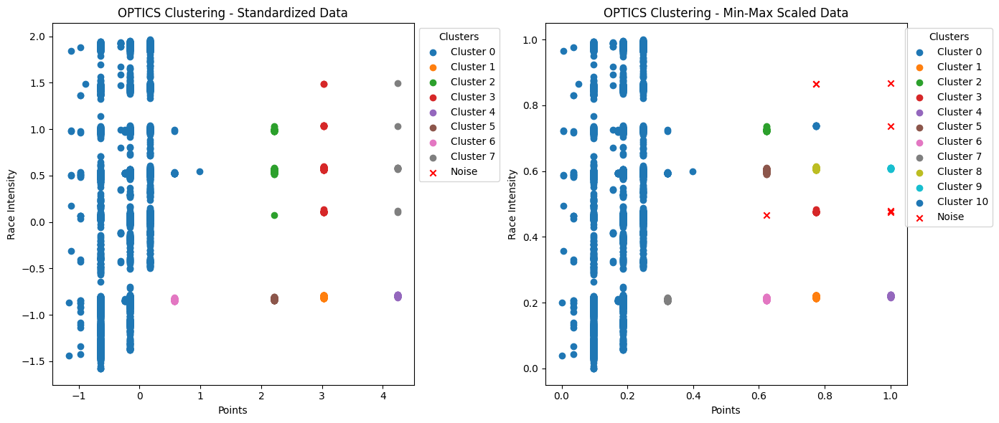

In [139]:
# Normalize the 'points' and 'race_intensity' columns
data_pri_standard, data_pri_minmax = normalize_data(races.drop_duplicates(subset='_url')[['points', 'race_intensity']], ['points','race_intensity'])

# OPTICS algorithm parameters
radius = [0.5, 0.1]  # Maximum distance to consider points in the same cluster
neighbors = [5,5]  # Minimum number of points to form a cluster

# Apply OPTICS clustering to the data
analyze_and_plot_optics(data_pri_standard.values, data_pri_minmax.values, radius, neighbors, xlabel='Points', ylabel='Race Intensity')


### 5. Applying OPTICS to *points* and *startlist_quality*.

To conclude the OPTICS clustering we compute that on 'points' and 'startlist_quality' with a the radius and the neighbors used at the beginning.

For the Standardize data the clusters appear to be well-defined. Cluster 0 remains the largest and there is a single noise point. 
For the Min-Max scaled data we have 12 cluster with the points well distributed inside them. This time the noisy values are concentrated at the lower and higher ends of 'startlist_quality' for each cluster.


--- OPTICS Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 4670 points
Cluster 1: 256 points
Cluster 2: 7 points
Cluster 3: 201 points
Cluster 4: 93 points
Cluster 5: 53 points
Noise: 1 points
Silhouette Score: 0.20489481106437982
Cohesion (Total Points in Clusters): 5280

--- OPTICS Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 85 points
Cluster 1: 1633 points
Cluster 2: 801 points
Cluster 3: 2097 points
Cluster 4: 246 points
Cluster 5: 7 points
Cluster 6: 201 points
Cluster 7: 93 points
Cluster 8: 45 points
Cluster 9: 18 points
Cluster 10: 10 points
Cluster 11: 16 points
Cluster 12: 6 points
Noise: 23 points
Silhouette Score: 0.05864561368311854
Cohesion (Total Points in Clusters): 5258


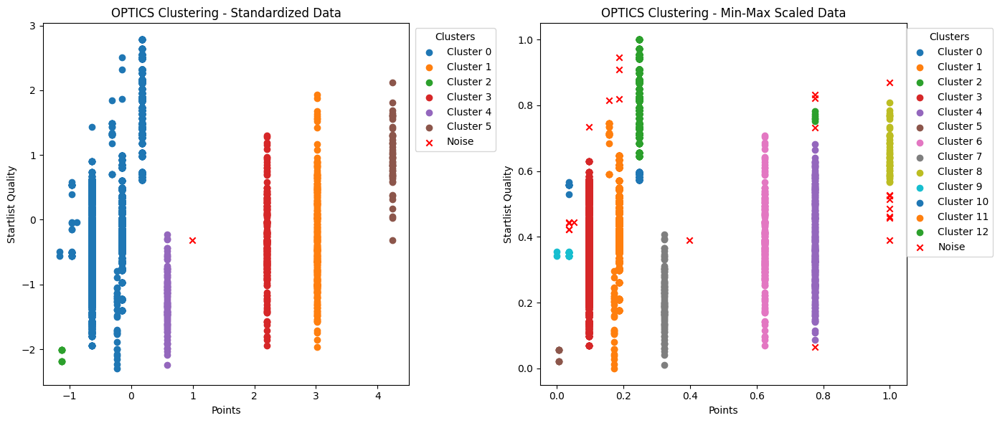

In [140]:
# Normalize the 'points' and 'startlist_quality' columns
data_psq_standard, data_psq_minmax = normalize_data(races.drop_duplicates(subset='_url')[['points', 'startlist_quality']], ['points','startlist_quality'])

# OPTICS algorithm parameters
radius = [0.4, 0.04]  # Maximum distance to consider points in the same cluster
neighbors = [5,5]  # Minimum number of points to form a cluster

# Apply OPTICS clustering to the data
analyze_and_plot_optics(data_psq_standard.values, data_psq_minmax.values, radius, neighbors, xlabel='Points', ylabel='Startlist Quality')

### CURE Clustering

CURE (Clustering Using Representatives) is an advanced hierarchical clustering algorithm that is designed to handle large datasets and identify clusters of different shapes and sizes. 

CURE starts by taking a random sample of the dataset to reduce computational complexity. This sample is used to approximate the overall data distribution. Initially, each point in the sample is treated as an individual cluster. The algorithm iteratively merges clusters based on their closest pair of representative points, similar to hierarchical clustering. For each cluster, CURE selects a fixed number of well-scattered points (known as *representative points*). These points are used to better capture the shape and spread of the cluster. To avoid sensitivity to outliers and better represent the true cluster shape, the representative points are shrunk towards the cluster's centroid by a specified fraction. This step helps balance cluster compactness and variability.
The algorithm continues to merge clusters based on the minimum distance between their representative points until a stopping condition (like a predefined number of clusters) is met. The final output shows clusters that can capture non-spherical and irregular shapes more effectively than standard hierarchical or centroid-based methods.

CURE is particularly useful for detecting clusters of arbitrary shapes and handling outliers robustly, which is an advantage over traditional algorithms like k-means that assume spherical clusters.


In [141]:
def analyze_and_plot_cure(data1, data2, num_clusters, xlabel, ylabel):
    """
    Analyzes, computes metrics, and plots side-by-side CURE clustering results for two datasets.
    
    :param data1: First dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param data2: Second dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param num_clusters: Number of clusters for the CURE algorithm
    :param xlabel: label for x axis
    :param ylabel: label for y axis
    """

    titles=["CURE Clustering - Standardized Data", "CURE Clustering - Min-Max Scaled Data"]


    fig, axes = plt.subplots(1, 2, figsize=(14, 6))  # 1 row, 2 columns

    for i, (data, title, ax) in enumerate(zip([data1, data2], titles, axes)):
        # Convert data to a list of lists for CURE
        data_list = data.tolist()

        # Initialize and process CURE
        cure_instance = cure(data_list, num_clusters)
        cure_instance.process()

        # Extract clusters
        clusters = cure_instance.get_clusters()

        # Prepare labels for silhouette score
        labels = np.full(len(data_list), -1)  # Start with all noise (-1)
        for cluster_id, cluster_points in enumerate(clusters):
            for point_index in cluster_points:
                labels[point_index] = cluster_id

        # Metrics Calculation
        if len(clusters) > 1:
            silhouette = silhouette_score(data, labels, metric='euclidean')
        else:
            silhouette = None  # Not defined for 1 cluster or all noise

        cohesion = sum(len(cluster) for cluster in clusters)

        # Print cluster analysis and metrics
        print(f"\n--- {title} ---")
        print("Cluster Analysis:")
        for cluster_id, cluster in enumerate(clusters):
            print(f"Cluster {cluster_id}: {len(cluster)} points")
        print(f"Silhouette Score: {silhouette if silhouette is not None else 'Not defined'}")
        print(f"Cohesion (Total Points in Clusters): {cohesion}")

        # Visualization
        colors = ['blue', 'green', 'orange', 'purple', 'cyan']  # Colors for clusters
        for cluster_id, cluster_points in enumerate(clusters):
            cluster_data = np.array([data_list[point_index] for point_index in cluster_points])
            ax.scatter(cluster_data[:, 0], cluster_data[:, 1], label=f'Cluster {cluster_id}', color=colors[cluster_id % len(colors)])

        # Customize the plot
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.set_title(title)
        ax.legend(title="Clusters", loc="upper right", bbox_to_anchor=(1.25, 1))

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()


### 1. Applying CURE to *weight* and *height*.

We decided to use the same number of clusters for both normalization.
For 'weight' and 'height' this resulted in three clusters for both: one contains the majority of the values, while the other two include only a small number of values each.


--- CURE Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 19 points
Cluster 1: 6110 points
Cluster 2: 5 points
Silhouette Score: 0.6550394618343554
Cohesion (Total Points in Clusters): 6134

--- CURE Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 13 points
Cluster 1: 1 points
Cluster 2: 6120 points
Silhouette Score: 0.7201021296724349
Cohesion (Total Points in Clusters): 6134


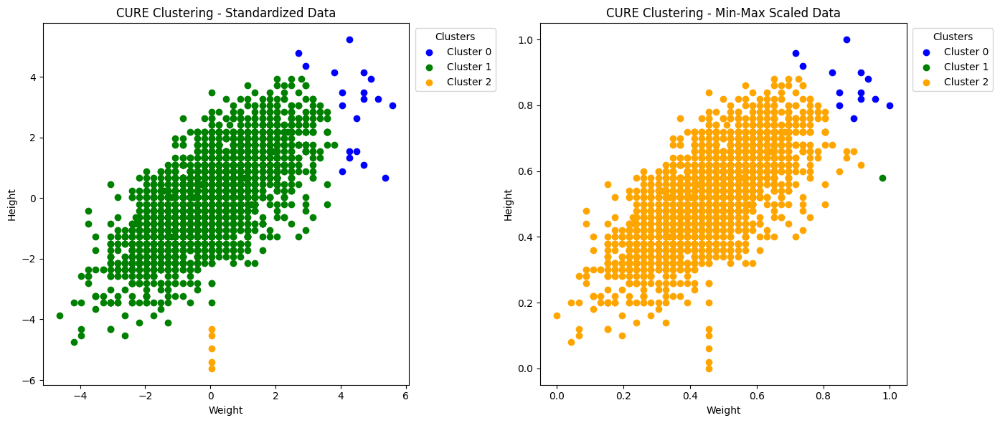

In [142]:
# Apply CURE clustering to the data
analyze_and_plot_cure(data_wh_standard.values, data_wh_minmax.values, 3, 'Weight', 'Height')

### 2. Applying CURE to *bmi* and *avg_position*.

For 'bmi' and 'avg_position' the number of cluster still three.

We have exactly the same division: Cluster 0 is the largest, Cluster 1 contains only one element and Cluster 2 just 3.


--- CURE Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 6130 points
Cluster 1: 1 points
Cluster 2: 3 points
Silhouette Score: 0.7196251832640628
Cohesion (Total Points in Clusters): 6134

--- CURE Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 6130 points
Cluster 1: 1 points
Cluster 2: 3 points
Silhouette Score: 0.6071655590854701
Cohesion (Total Points in Clusters): 6134


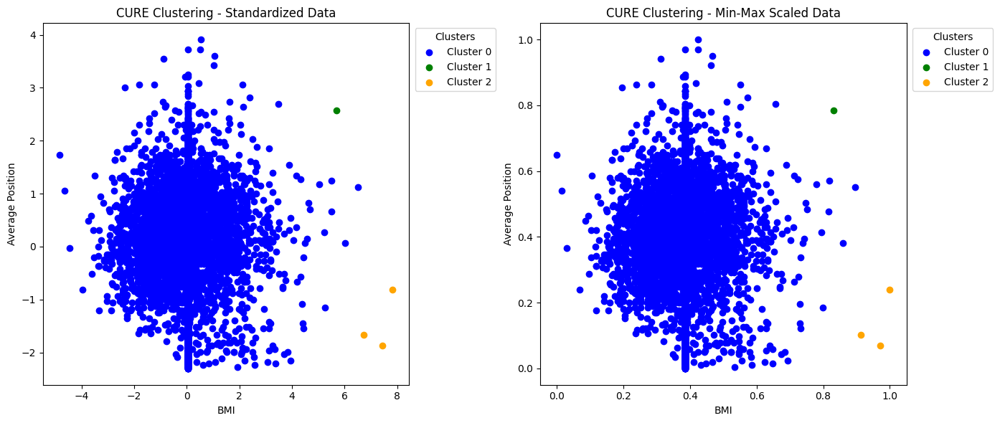

In [143]:
# Apply CURE clustering to the data
analyze_and_plot_cure(data_bap_standard.values, data_bap_minmax.values, 3, 'BMI', 'Average Position')

### 3. Applying CURE to *avg_delta* and *avg_position*.

The clustering of 'avg_delta' and 'avg_position' is also performed with three clusters.

The same evaluation made in the previous case applies in this case too.


--- CURE Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 6118 points
Cluster 1: 12 points
Cluster 2: 4 points
Silhouette Score: 0.6299447391501561
Cohesion (Total Points in Clusters): 6134

--- CURE Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 9 points
Cluster 1: 6124 points
Cluster 2: 1 points
Silhouette Score: 0.6217798082656368
Cohesion (Total Points in Clusters): 6134


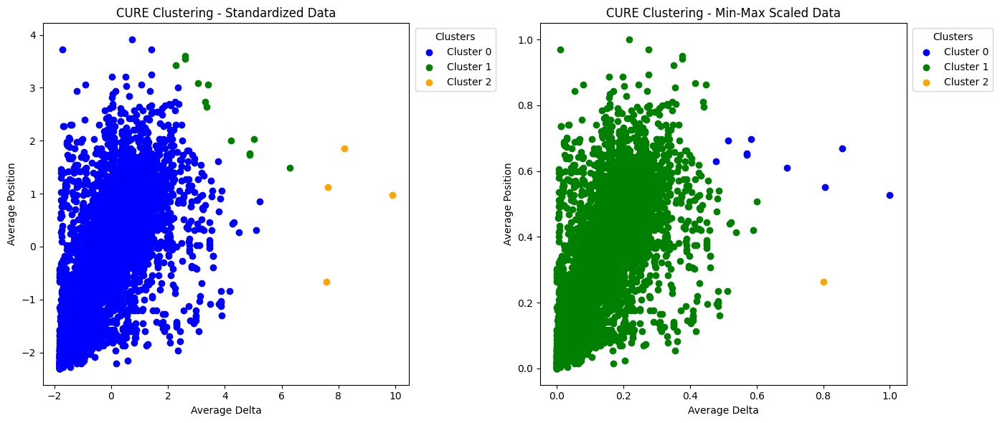

In [144]:
# Apply CURE clustering to the data
analyze_and_plot_cure(data_adap_standard.values, data_adap_minmax.values, 3, 'Average Delta', 'Average Position')

### 4. Applying CURE to *position* and *race_intensity*.

For 'position' and 'race_intensity', the number of clusters chosen is still three.

The two divisions obtained are very different, for the standardized data there is a division by columns with three well-formed clusters, the data scaled with Min-Max instead groups the clusters by "zones". According to Silhouette Score the first is the best.


--- CURE Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 457 points
Cluster 1: 53 points
Cluster 2: 4771 points
Silhouette Score: 0.5901958499162671
Cohesion (Total Points in Clusters): 5281

--- CURE Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 3914 points
Cluster 1: 857 points
Cluster 2: 510 points
Silhouette Score: 0.5503401599212269
Cohesion (Total Points in Clusters): 5281


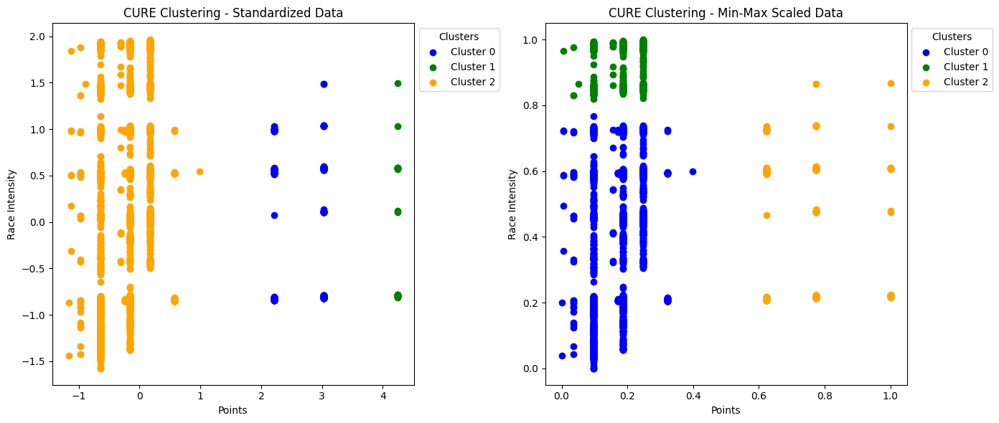

In [145]:
# Apply CURE clustering to the data
analyze_and_plot_cure(data_pri_standard.values, data_pri_minmax.values, 3, 'Points', 'Race Intensity')

### 5. Applying CURE to *position* and *startlist_quality*.

Also in this case there is a division into three clusters, both are well-formed with the first that is slightly better as also highlighted by silhouette score.


--- CURE Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 457 points
Cluster 1: 53 points
Cluster 2: 4771 points
Silhouette Score: 0.6114740312302258
Cohesion (Total Points in Clusters): 5281

--- CURE Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 62 points
Cluster 1: 448 points
Cluster 2: 4771 points
Silhouette Score: 0.5958111189221201
Cohesion (Total Points in Clusters): 5281


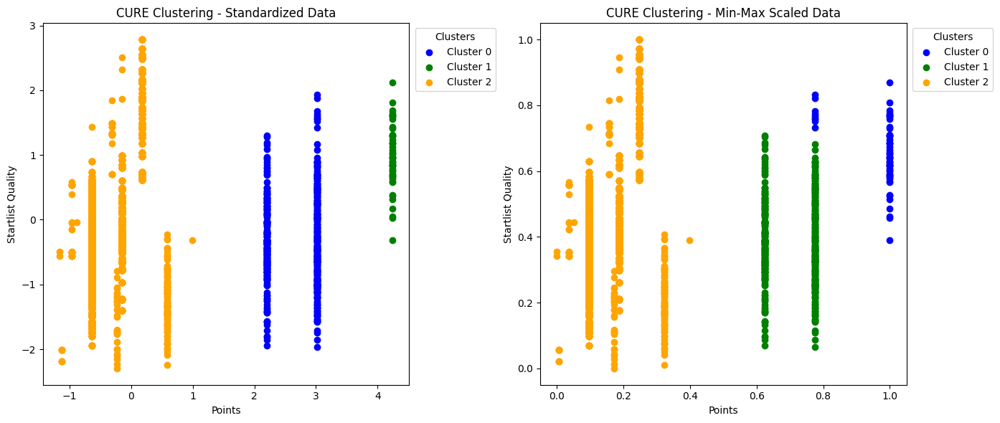

In [146]:
# Apply CURE clustering to the data
analyze_and_plot_cure(data_psq_standard.values, data_psq_minmax.values, 3, 'Points', 'Startlist Quality')

# Analysis and Conclusions

To conclude, we compare the clustering results for each pair of features and evaluate the performance of the methods used, highlighting their strengths and limitations. The analysis now reflects the influence of normalization methods (Min-Max scaling and standardization) on clustering outcomes.

## Weight and Height:

After normalizing the data, hierarchical clustering methods such as Complete Linkage and Ward Linkage produced clear and well-separated clusters. K-means also showed consistent performance, with standardized data ensuring balanced cluster sizes. Single and Average Linkage struggled with fragmentation, especially when noise was present. OPTICS and DBSCAN had limited success in isolating noise, though OPTICS showed some improvement with standardization.

## BMI and Average Position:

Normalization played a crucial role in enhancing the clustering performance for these features. Standardization yielded well-defined clusters for methods like K-means and Ward Linkage, effectively capturing patterns between BMI and average position. Hierarchical methods like Average Linkage were less effective, particularly under Min-Max scaling. DBSCAN and Single Linkage formed large clusters, with OPTICS identifying some noise points.

## Average Delta and Average Position:

Standardization reduced the impact of outliers and highlighted a trend of increasing noise as avg_delta grew. K-means and Ward Linkage benefited most from this preprocessing, producing clear and meaningful clusters. Min-Max scaling was less effective, leading to clusters with more overlap and less separation. Among the hierarchical methods, Ward Linkage continued to perform well, while Average Linkage struggled to distinguish between noise and actual clusters. CURE maintained its effectiveness, particularly for distinguishing smaller clusters from noise.

## Points and Race Intensity:

Standardization helped highlight the structure of these features, especially for hierarchical methods. K-means and Ward Linkage produced two large, well-separated clusters under standardized data, reflecting the fixed nature of points values. Min-Max scaling led to less consistent results, with DBSCAN and OPTICS performing poorly in identifying meaningful clusters. Hierarchical methods under standardized data grouped the data more effectively, capturing subtle patterns in race intensity.

## Points and Startlist Quality:

The feature startlist_quality continued to dominate clustering results, especially after standardization. Most methods, including K-means and Ward Linkage, produced more balanced and meaningful clusters when standardized data was used. Min-Max scaling, on the other hand, led to centroid shifts and less defined clusters. OPTICS and DBSCAN showed minimal improvement, with Single Linkage failing to produce distinct clusters in both cases. Standardized data emphasized the strengths of hierarchical and centroid-based methods, reaffirming their suitability for this feature pair.

## General Observations:

- **Normalization Impact**: Both Min-Max scaling and standardization improved the performance of clustering methods, with standardization being more consistent across feature pairs.

- **Method Performance**: Ward Linkage and K-means proved robust across most feature pairs, while DBSCAN and Single Linkage struggled to handle noise and outliers effectively.

- **Noise and Outliers**: DBSCAN and OPTICS showed potential for handling noise, with better results under standardized data.

In summary, the task highlighted the importance of preprocessing and the strengths of specific clustering methods for different feature combinations. Standardization emerged as the preferred normalization technique, ensuring better-defined clusters and enhancing the interpretability of results.